# Import

In [1]:
import os
import sys

import copy
import pickle
import math
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
import pandas as pd
import seaborn as sns
from sklearn.metrics import mean_squared_error
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

from datetime import datetime
import time
from IPython.display import clear_output

import pytransform3d.rotations as pr
from pytransform3d.plot_utils import make_3d_axis
from scipy.spatial.transform import Rotation
from sklearn.linear_model import LinearRegression

from utils import *
from grace.utils import *
from grace.attention import *
import cv2.aruco as aruco

# Initialization

## Helper Functions

In [2]:
calib_params = load_json('config/calib/calib_params.json')
camera_mtx = load_json("config/camera/camera_mtx.json")
left_eye_camera_mtx = np.array(camera_mtx['left_eye']['camera_matrix'])
left_eye_dist_coef = np.array(camera_mtx['left_eye']['distortion_coefficients']).squeeze()
right_eye_camera_mtx = np.array(camera_mtx['right_eye']['camera_matrix'])
right_eye_dist_coef = np.array(camera_mtx['right_eye']['distortion_coefficients']).squeeze()
chest_cam_camera_mtx = np.array(camera_mtx['chest_cam']['camera_matrix'])
chest_cam_dist_coef = np.array(camera_mtx['chest_cam']['distortion_coefficients']).squeeze()

attention = ChArucoAttention()

%matplotlib widget

pan_direction: {
    0: 'left_left',
    1: 'left_right',
    2: 'right_left',
    3: 'right_right',
}
    
tilt_direction: {
    0: 'down_down',
    1: 'down_up',
    2: 'up_down',
    3: 'up_up',
}
    
chessboard_size = (11,6)
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
          '#7fff00', '#d2b48c', '#000080', '#029386', '#FC5A50']

def read_pickle_file(file_path):
    with open(file_path, 'rb') as file:
        data = pickle.load(file)
    return data

def get_phi_direction(theta, theta_tminus1, data, i):
    phi_direction = None
    try:
        if data[theta][i-1]<data[theta_tminus1][i-1] and data[theta][i]<data[theta_tminus1][i]:
            phi_direction = 0
        elif data[theta][i-1]<data[theta_tminus1][i-1] and data[theta][i]>=data[theta_tminus1][i]:
            phi_direction = 1
        elif data[theta][i-1]>=data[theta_tminus1][i-1] and data[theta][i]<data[theta_tminus1][i]:
            phi_direction = 2
        elif data[theta][i-1]>=data[theta_tminus1][i-1] and data[theta][i]>=data[theta_tminus1][i]:
            phi_direction = 3
    except:
        phi_direction = 0
    return phi_direction

def get_chess_corners(img, camera_mtx, dist_coef):
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, chessboard_size, None)
    
    # Subcorner Pixel Accuracy
    if ret:
        criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
        corners = cv2.cornerSubPix(gray, corners, (9,9), (-1,-1), criteria)
        corners = corners.squeeze()
    else:
        corners = None
    
    return corners

def get_chess_obj_pts(img, depth_img, camera_mtx, dist_coef):
    corners = get_chess_corners(img, camera_mtx, dist_coef)
    if corners is not None:
        int_corners = np.round(corners).astype(int)

        depth_list = []
        for corner in int_corners:
            depth_list.append(depth_img[corner[1], corner[0]])
        depth_list = np.array(depth_list)
        depth_mean = np.mean(depth_list[np.nonzero(depth_list)])/1000.0

        fx = camera_mtx[0][0]
        cx = camera_mtx[0][2]
        fy = camera_mtx[1][1]
        cy = camera_mtx[1][2]

        obj_pts = []
        for i,(u,v) in enumerate(corners):
            z = depth_list[i]/1000.0
            if z<=0:
                z = depth_mean
            z = z - 0.0042  # Added realsense discrepancy
            x = ((u-cx)/fx)*z
            y = ((v-cy)/fy)*z
            obj_pts.append([x, y, z])
        obj_pts = np.array(obj_pts)
    else:
        obj_pts = None
        
    return obj_pts

def get_camera_pose(img, obj_pts, camera_mtx, dist_coef):
    # Get corners
    corners = get_chess_corners(img, camera_mtx, dist_coef)
    
    if corners is not None:
        # Estimate the extrinsic matrix
        # retval, rvec, tvec = cv2.solvePnP(obj_pts, corners, camera_mtx, dist_coef)
        retval, rvec, tvec = cv2.solvePnP(obj_pts, corners, camera_mtx, dist_coef, flags=cv2.SOLVEPNP_SQPNP )
        # retval, rvec, tvec = cv2.solvePnP(obj_pts, corners, camera_mtx, dist_coef, rvec, tvec=np.array([0,0,0.25]), useExtrinsicGuess = True)

        # Convert the rotation vector to a rotation matrix
        rotation_matrix, _ = cv2.Rodrigues(rvec)

        # Homogeneous Coordinates
        H = np.eye(4)
        H[:3,:3] = rotation_matrix
        H[:3,-1] = tvec.T

        # Camera Pose
        T = np.linalg.inv(H)
    else:
        T = None
    
    return T

def get_charuco_camera_pose(img, camera_mtx, dist_coef):
    charuco_corners, charuco_ids, marker_corners, marker_ids = attention.charuco_detector.detectBoard(img)
    if not (charuco_ids is None) and len(charuco_ids) >= 4:
        try:
            obj_points, img_points = attention.board.matchImagePoints(charuco_corners, charuco_ids)
            flag, rvec, tvec = cv2.solvePnP(obj_points, img_points, camera_mtx, dist_coef)

            # Convert the rotation vector to a rotation matrix
            rotation_matrix, _ = cv2.Rodrigues(rvec)
    
            # Homogeneous Coordinates
            H = np.eye(4)
            H[:3,:3] = rotation_matrix
            H[:3,-1] = tvec.T
    
            # Camera Pose
            T = np.linalg.inv(H)
        
        except cv2.error as error_inst:
            print("SolvePnP recognize calibration pattern as non-planar pattern. To process this need to use "
                  "minimum 6 points. The planar pattern may be mistaken for non-planar if the pattern is "
                  "deformed or incorrect camera parameters are used.")
            print(error_inst.err)
            T = None
    else:
        T = None

    return T
        

def plot_charuco(img, camera_mtx, dist_coef):
    image_copy = np.copy(img)
    charuco_corners, charuco_ids, marker_corners, marker_ids = attention.charuco_detector.detectBoard(img)
    if not (marker_ids is None) and len(marker_ids) > 0:
        aruco.drawDetectedMarkers(image_copy, marker_corners)
    if not (charuco_ids is None) and len(charuco_ids) > 0:
        aruco.drawDetectedCornersCharuco(image_copy, charuco_corners, charuco_ids)
        if len(camera_mtx) > 0 and len(charuco_ids) >= 4:
            try:
                obj_points, img_points = attention.board.matchImagePoints(charuco_corners, charuco_ids)
                flag, rvec, tvec = cv2.solvePnP(obj_points, img_points, camera_mtx, dist_coef)
                if flag:
                    cv2.drawFrameAxes(image_copy, camera_mtx, dist_coef, rvec, tvec, .2)
            except cv2.error as error_inst:
                print("SolvePnP recognize calibration pattern as non-planar pattern. To process this need to use "
                      "minimum 6 points. The planar pattern may be mistaken for non-planar if the pattern is "
                      "deformed or incorrect camera parameters are used.")
                print(error_inst.err)
    return image_copy

def get_charuco_rmse_pose(img, camera_mtx, dist_coef):
    charuco_corners, charuco_ids, marker_corners, marker_ids = attention.charuco_detector.detectBoard(img)
    if not (charuco_ids is None) and len(charuco_ids) >= 4:
        try:
            obj_points, img_points = attention.board.matchImagePoints(charuco_corners, charuco_ids)
            flag, rvec, tvec = cv2.solvePnP(obj_points, img_points, camera_mtx, dist_coef)
    
            # Project the 3D points onto the image plane
            projected_points, _ = cv2.projectPoints(obj_points, rvec, tvec, camera_mtx, dist_coef)
    
            # Calculate the RMSE
            error = np.sqrt(np.mean(np.square(img_points.squeeze() - projected_points.squeeze())))
        
        except cv2.error as error_inst:
            print("SolvePnP recognize calibration pattern as non-planar pattern. To process this need to use "
                  "minimum 6 points. The planar pattern may be mistaken for non-planar if the pattern is "
                  "deformed or incorrect camera parameters are used.")
            print(error_inst.err)
            error = 1000
    else:
        error = 1000

    return error

def get_rmse_pose(T, img, obj_pts, camera_mtx, dist_coef):
    if T is not None:
        T = np.linalg.inv(T)  # Input T is T_board_to_any
        corners = get_chess_corners(img, camera_mtx, dist_coef)

        rvec,_ = cv2.Rodrigues(T[:3,:3])
        tvec = T[:3,-1].reshape(-1,1)

        # Project the 3D points onto the image plane
        projected_points, _ = cv2.projectPoints(obj_pts, rvec, tvec, camera_mtx, dist_coef)

        # Calculate the RMSE
        error = np.sqrt(np.mean(np.square(corners - projected_points.squeeze())))
    else:
        error = 1000
    return error
    
def depth_to_pointcloud(px, depth_img, camera_mtx, dist_coef, z_replace):  
    fx = camera_mtx[0][0]
    cx = camera_mtx[0][2]
    fy = camera_mtx[1][1]
    cy = camera_mtx[1][2]
    u_prime, v_prime = cv2.undistortPoints(np.array([px]), camera_mtx, dist_coef, P=camera_mtx).squeeze()
    u = round(px[0])
    v = round(px[1])
    z = depth_img[round(v_prime),round(u_prime)]/1000.0
    z = z - 0.0042  # Added realsense discrepancy
    if z<=0:
        z = z_replace
    x = ((u_prime-cx)/fx)*z
    y = ((v_prime-cy)/fy)*z
    return x,y,z

def transform_points(pts, T_mtx):
    new_obj_pts = []
    for pt in pts:
        temp_pt = np.append(pt, 1).reshape(-1,1)
        temp_pt2 = (T_mtx @ temp_pt).squeeze()
        new_obj_pts.append(temp_pt2[:3])
    new_obj_pts = np.array(new_obj_pts)
    return new_obj_pts

def chest_rgb_to_eye(T_chest, T_input):
    T_chest_inv = np.linalg.inv(T_chest)  # T_cb = T_bc^(-1)
    T_final = np.matmul(T_chest_inv, T_input)  # T_cl = T_cb x T_bl
    return T_final

def mean_T(homo_arr):
    # Element-wise mean
    T_temp = np.mean(homo_arr, axis=0)

    # Rotation matrix to quaternions
    rot_mat_list = [matrix[:3, :3] for matrix in homo_arr]
    quat_list = [Rotation.from_matrix(matrix).as_quat() for matrix in rot_mat_list]
    
    # Create a Rotation object from the quaternions
    rot_obj = Rotation.from_quat(quat_list)
    
    # Calculate the mean rotation
    mean_rot_obj = rot_obj.mean()
    mean_rot_mat = mean_rot_obj.as_matrix()
    
    # Consolidating the Results
    T_ave = np.eye(4)
    T_ave[:3,:3] = mean_rot_mat
    T_ave[:,-1] = T_temp[:,-1]

    return T_ave

def get_world_deproject(eye, camera_mtx, dist_coef, T_be):
    # Foveal Center
    gx = calib_params[eye]['x_center']
    gy = calib_params[eye]['y_center']

    # Get Normalized Camera Coordinates
    x_prime, y_prime = cv2.undistortPoints((gx,gy),   # x' = X_C/Z_C
                        camera_mtx,                   # y' = Y_C/Z_C
                        dist_coef).squeeze()

    # Inverse of T_be
    T = np.linalg.inv(T_be)

    # System of Linear Equations
    a = np.array([[T[0,0],T[0,1],-x_prime], 
                  [T[1,0],T[1,1],-y_prime],
                  [T[2,0],T[2,1],-1.0]])
    b = np.array([-T[0,3],-T[1,3],-T[2,3]])
    
    # Deprojection
    x = np.linalg.solve(a,b)  # X_W, Y_W, Z_C
    world_pts = np.array([x[0],x[1],0])  # X_W, Y_W, Z_W

    return world_pts

def get_chest_cam_proj(world_pts, T_bc):
    T_cb = np.linalg.inv(T_bc)
    rvec, _ = cv2.Rodrigues(T_cb[:3,:3])
    tvec = T_cb[:3,3].reshape(-1,1)
    u,v = cv2.projectPoints(world_pts, rvec, tvec, 
                            chest_cam_camera_mtx,
                            chest_cam_dist_coef)[0].squeeze()
    return u,v

def create_anaglyph(left_image, right_image):
    """
    Creates an anaglyph image from two input images.
    
    Args:
        left_image (np.ndarray): The left image.  # Green
        right_image (np.ndarray): The right image.  #  Purple
    
    Returns:
        np.ndarray: The anaglyph image.
    """
    # Convert the images to grayscale
    left_gray = cv2.cvtColor(left_image, cv2.COLOR_BGR2GRAY)
    right_gray = cv2.cvtColor(right_image, cv2.COLOR_BGR2GRAY)
    
    # Create the anaglyph image
    anaglyph = np.zeros_like(left_image)
    anaglyph[:, :, 0] = right_gray  # Red channel
    anaglyph[:, :, 1] = left_gray  # Green channel
    anaglyph[:, :, 2] = right_gray  # Blue channel
    
    return anaglyph

def create_anaglyph_gray(left_gray, right_gray):
    # Create the anaglyph image
    anaglyph = np.zeros((left_gray.shape[0],left_gray.shape[1],3), dtype=int)
    anaglyph[:, :, 0] = right_gray  # Red channel
    anaglyph[:, :, 1] = left_gray  # Green channel
    anaglyph[:, :, 2] = right_gray  # Blue channel
    
    return anaglyph

def get_homography(img1, img2, camera_mtx, dist_coef):
    # Undistort Input Image 
    img1 = cv2.undistort(img1, camera_mtx, dist_coef)

    # Initialization
    MIN_MATCH_COUNT = 10
    FLANN_INDEX_KDTREE = 1
    sift = cv2.SIFT_create()
    
    # Conversion to Grayscale
    img1_gray = cv2.cvtColor(copy.deepcopy(img1), cv2.COLOR_BGR2GRAY) 
    img2_gray = cv2.cvtColor(copy.deepcopy(img2), cv2.COLOR_BGR2GRAY)
    
    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(img1_gray,None)
    kp2, des2 = sift.detectAndCompute(img2_gray,None)
    
    # KNN Matching
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    
    # store all the good matches as per Lowe's ratio test.
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)

    # Find Homography
    if len(good)>MIN_MATCH_COUNT:
        # Source and Destination Points
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    
        # Find perspective transformation between two planes.
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
        matchesMask = mask.ravel().tolist()
    else:
        print( "Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
        matchesMask = None

    return M, matchesMask

def project_homography(u,v, M, camera_mtx, dist_coef):
    # Undistort Points
    u_prime, v_prime = cv2.undistortPoints((u,v), 
                                            camera_mtx, dist_coef, 
                                            P=camera_mtx).squeeze()
    # Homography Projection
    pts = np.float32([[u_prime,v_prime]]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M).squeeze()  # Transform pixel points from source to destination
    return dst

def get_rmse(arr1, arr2):
    error = np.sqrt(np.mean(np.square(arr1 - arr2)))
    return error

# Loading of Data

## Pickle Data

In [3]:
filename = 'pantilt_baseline_sweep_charuco_pickle_20240530_063417_972544.pickle'

In [4]:
fn_path = os.path.join(os.getcwd(), 'results', 'pantilt_baseline_sweep_charuco',filename)
data = read_pickle_file(fn_path)
data = data['data']

In [5]:
pickle_df = pd.DataFrame(data)

## Preprocessing



In [6]:
# Assigning next step data for tminus1

pickle_df['theta_left_pan_cmd_tminus2'] = [0,0] + pickle_df['theta_left_pan_cmd'][:-2].tolist() 
pickle_df['theta_right_pan_cmd_tminus2'] = [0,0] + pickle_df['theta_right_pan_cmd'][:-2].tolist() 
pickle_df['theta_tilt_cmd_tminus2'] = [0,0] + pickle_df['theta_tilt_cmd'][:-2].tolist()
pickle_df['theta_left_pan_cmd_tminus1'] = [0] + pickle_df['theta_left_pan_cmd'][:-1].tolist() 
pickle_df['theta_right_pan_cmd_tminus1'] = [0] + pickle_df['theta_right_pan_cmd'][:-1].tolist() 
pickle_df['theta_tilt_cmd_tminus1'] = [0] + pickle_df['theta_tilt_cmd'][:-1].tolist()
pickle_df['chess_idx_tminus1'] = [0] + pickle_df['chess_idx'][:-1].tolist() 
pickle_df['theta_left_pan_tminus1'] = [0] + pickle_df['theta_left_pan'][:-1].tolist() 
pickle_df['theta_right_pan_tminus1'] = [0] + pickle_df['theta_right_pan'][:-1].tolist() 
pickle_df['theta_tilt_tminus1'] = [0] + pickle_df['theta_tilt'][:-1].tolist()
pickle_df['plan_phi_left_pan_tminus2'] = [0,0] + pickle_df['plan_phi_left_pan'][:-2].tolist()
pickle_df['plan_phi_right_pan_tminus2'] = [0,0] + pickle_df['plan_phi_right_pan'][:-2].tolist()
pickle_df['plan_phi_tilt_tminus2'] = [0,0] + pickle_df['plan_phi_tilt'][:-2].tolist()
pickle_df['plan_phi_left_pan_tminus1'] = [0] + pickle_df['plan_phi_left_pan'][:-1].tolist()
pickle_df['plan_phi_right_pan_tminus1'] = [0] + pickle_df['plan_phi_right_pan'][:-1].tolist()
pickle_df['plan_phi_tilt_tminus1'] = [0] + pickle_df['plan_phi_tilt'][:-1].tolist()

In [7]:
# Phi Direction

phi_direction_left_pan_list = [0] + [get_phi_direction(theta='plan_phi_left_pan_tminus1',
                                                       theta_tminus1='plan_phi_left_pan_tminus2',
                                                       data=pickle_df, i=i) 
                                     for i in range(1, len(pickle_df))]
phi_direction_right_pan_list = [0] + [get_phi_direction(theta='plan_phi_right_pan_tminus1',
                                                        theta_tminus1='plan_phi_right_pan_tminus2',
                                                        data=pickle_df, i=i) 
                                     for i in range(1, len(pickle_df))]
phi_direction_tilt_list = [0] + [get_phi_direction(theta='plan_phi_tilt_tminus1',
                                                   theta_tminus1='plan_phi_tilt_tminus2',
                                                   data=pickle_df, i=i) 
                                     for i in range(1, len(pickle_df))]

pickle_df['phi_direction_left_pan'] = phi_direction_left_pan_list
pickle_df['phi_direction_right_pan'] = phi_direction_right_pan_list
pickle_df['phi_direction_tilt'] = phi_direction_tilt_list

In [8]:
pickle_df.columns

Index(['chess_idx', 'theta_left_pan', 'theta_right_pan', 'theta_tilt',
       'chest_cam_px_x_tminus1', 'chest_cam_px_y_tminus1',
       'left_eye_px_x_tminus1', 'left_eye_px_y_tminus1',
       'right_eye_px_x_tminus1', 'right_eye_px_y_tminus1', 'chest_cam_px_x',
       'chest_cam_px_y', 'left_eye_px_x', 'left_eye_px_y', 'right_eye_px_x',
       'right_eye_px_y', 'dx_l', 'dy_l', 'dx_r', 'dy_r', '3d_point',
       'chest_pan_angle', 'chest_tilt_angle', 'plan_phi_left_pan',
       'plan_phi_right_pan', 'plan_phi_tilt', 'chest_img', 'left_eye_img',
       'right_eye_img', 'depth_img', 'chest_img_stamp', 'left_eye_img_stamp',
       'right_eye_img_stamp', 'depth_img_stamp', 'theta_left_pan_cmd',
       'theta_right_pan_cmd', 'theta_tilt_cmd', 'theta_left_pan_cmd_tminus2',
       'theta_right_pan_cmd_tminus2', 'theta_tilt_cmd_tminus2',
       'theta_left_pan_cmd_tminus1', 'theta_right_pan_cmd_tminus1',
       'theta_tilt_cmd_tminus1', 'chess_idx_tminus1', 'theta_left_pan_tminus1',
       't

In [9]:
# Dropping the first row
pickle_df = pickle_df.drop(np.arange(0,2)).reset_index(drop=True)
pickle_df.head()

,chess_idx,theta_left_pan,theta_right_pan,theta_tilt,chest_cam_px_x_tminus1,chest_cam_px_y_tminus1,left_eye_px_x_tminus1,left_eye_px_y_tminus1,right_eye_px_x_tminus1,right_eye_px_y_tminus1,...,theta_tilt_tminus1,plan_phi_left_pan_tminus2,plan_phi_right_pan_tminus2,plan_phi_tilt_tminus2,plan_phi_left_pan_tminus1,plan_phi_right_pan_tminus1,plan_phi_tilt_tminus1,phi_direction_left_pan,phi_direction_right_pan,phi_direction_tilt
0,4,-15.820312,-17.402344,20.126953,424,240,-360.6,-224.7,-222.3,-235.9,...,21.972656,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3
1,6,-15.820312,-17.402344,22.060547,424,240,-360.6,-224.7,-222.3,-235.9,...,20.126953,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3
2,8,-15.468750,-15.908203,20.126953,424,240,-360.6,-224.7,-222.3,-235.9,...,22.060547,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3
3,6,-16.171875,-17.490234,21.972656,424,240,-360.6,-224.7,-222.3,-235.9,...,20.126953,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3
4,4,-14.062500,-14.238281,20.126953,424,240,-360.6,-224.7,-222.3,-235.9,...,21.972656,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3


# 1st Filtering: Remove Reset Command

In [10]:
filt_df = pickle_df[(pickle_df['theta_left_pan_cmd_tminus1']>=-14) 
                     & (pickle_df['theta_left_pan_cmd_tminus1']<=14)
                     & (pickle_df['theta_tilt_cmd_tminus1']>=-25)
                     & (pickle_df['theta_tilt_cmd_tminus1']<=15)].reset_index(drop=True)
filt_df.head()

,chess_idx,theta_left_pan,theta_right_pan,theta_tilt,chest_cam_px_x_tminus1,chest_cam_px_y_tminus1,left_eye_px_x_tminus1,left_eye_px_y_tminus1,right_eye_px_x_tminus1,right_eye_px_y_tminus1,...,theta_tilt_tminus1,plan_phi_left_pan_tminus2,plan_phi_right_pan_tminus2,plan_phi_tilt_tminus2,plan_phi_left_pan_tminus1,plan_phi_right_pan_tminus1,plan_phi_tilt_tminus1,phi_direction_left_pan,phi_direction_right_pan,phi_direction_tilt
0,8,-14.150391,-14.238281,15.205078,424,240,-360.6,-224.7,-222.3,-235.9,...,21.884766,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3
1,4,-11.953125,-12.128906,15.117188,424,240,-360.6,-224.7,-222.3,-235.9,...,21.884766,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3
2,0,-9.931641,-10.107422,15.117188,424,240,-360.6,-224.7,-222.3,-235.9,...,22.060547,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3
3,4,-8.173828,-8.085938,15.205078,424,240,-360.6,-224.7,-222.3,-235.9,...,22.060547,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3
4,8,-6.416016,-6.064453,15.205078,424,240,-360.6,-224.7,-222.3,-235.9,...,22.060547,0.0,0.0,0.0,0.0,0.0,0.0,3,3,3


In [11]:
print(filt_df['theta_left_pan_cmd_tminus1'].unique())
print(filt_df['theta_right_pan_cmd_tminus1'].unique())
print(filt_df['theta_tilt_cmd_tminus1'].unique())

[-14 -12 -10  -8  -6  -4  -2   0   2   4   6   8  10  12  14]
[-14 -12 -10  -8  -6  -4  -2   0   2   4   6   8  10  12  14]
[ 15  10   5   0  -5 -10 -15 -20 -25]


#  Charuco Corner Detection and Camera Pose

In [12]:
# Define the 3D coordinates of the chessboard corners in the world coordinate system
chessboard_size = (11, 6)
origin_point = [0,0]
square_size = 0.194 # Assumming each square size is 1 unit
obj_pts = np.zeros(((chessboard_size[0]-1) * (chessboard_size[1]-1), 3), np.float32)
obj_pts[:,:2] = (np.mgrid[1:chessboard_size[0], 1:chessboard_size[1]].T.reshape(-1, 2)-np.array(origin_point)) * square_size
obj_pts

array([[0.194, 0.194, 0.   ],
       [0.388, 0.194, 0.   ],
       [0.582, 0.194, 0.   ],
       [0.776, 0.194, 0.   ],
       [0.97 , 0.194, 0.   ],
       [1.164, 0.194, 0.   ],
       [1.358, 0.194, 0.   ],
       [1.552, 0.194, 0.   ],
       [1.746, 0.194, 0.   ],
       [1.94 , 0.194, 0.   ],
       [0.194, 0.388, 0.   ],
       [0.388, 0.388, 0.   ],
       [0.582, 0.388, 0.   ],
       [0.776, 0.388, 0.   ],
       [0.97 , 0.388, 0.   ],
       [1.164, 0.388, 0.   ],
       [1.358, 0.388, 0.   ],
       [1.552, 0.388, 0.   ],
       [1.746, 0.388, 0.   ],
       [1.94 , 0.388, 0.   ],
       [0.194, 0.582, 0.   ],
       [0.388, 0.582, 0.   ],
       [0.582, 0.582, 0.   ],
       [0.776, 0.582, 0.   ],
       [0.97 , 0.582, 0.   ],
       [1.164, 0.582, 0.   ],
       [1.358, 0.582, 0.   ],
       [1.552, 0.582, 0.   ],
       [1.746, 0.582, 0.   ],
       [1.94 , 0.582, 0.   ],
       [0.194, 0.776, 0.   ],
       [0.388, 0.776, 0.   ],
       [0.582, 0.776, 0.   ],
       [0.

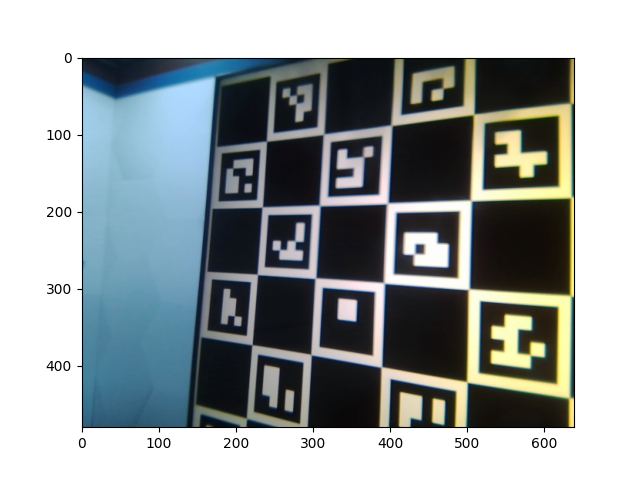

In [13]:
# Input
img = copy.deepcopy(filt_df['left_eye_img'][0])
camera_mtx = copy.deepcopy(left_eye_camera_mtx)
dist_coef = copy.deepcopy(left_eye_dist_coef)

plt.figure()
plt.imshow(img)

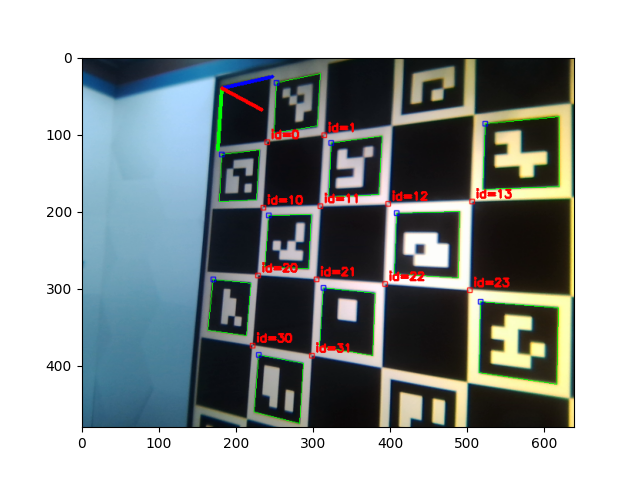

In [14]:
# Charuco and Marker Detection

image_copy = np.copy(img)
charuco_corners, charuco_ids, marker_corners, marker_ids = attention.charuco_detector.detectBoard(img)
if not (marker_ids is None) and len(marker_ids) > 0:
    aruco.drawDetectedMarkers(image_copy, marker_corners)
if not (charuco_ids is None) and len(charuco_ids) > 0:
    aruco.drawDetectedCornersCharuco(image_copy, charuco_corners, charuco_ids)
    if len(camera_mtx) > 0 and len(charuco_ids) >= 4:
        try:
            obj_points, img_points = attention.board.matchImagePoints(charuco_corners, charuco_ids)
            flag, rvec, tvec = cv2.solvePnP(obj_points, img_points, camera_mtx, dist_coef)
            if flag:
                cv2.drawFrameAxes(image_copy, camera_mtx, dist_coef, rvec, tvec, .2)
        except cv2.error as error_inst:
            print("SolvePnP recognize calibration pattern as non-planar pattern. To process this need to use "
                  "minimum 6 points. The planar pattern may be mistaken for non-planar if the pattern is "
                  "deformed or incorrect camera parameters are used.")
            print(error_inst.err)
plt.figure()
plt.imshow(image_copy)

In [15]:
print('Object Points:', obj_points)
print('Image Points:', img_points)

Object Points: [[[0.194 0.194 0.   ]]

 [[0.388 0.194 0.   ]]

 [[0.194 0.388 0.   ]]

 [[0.388 0.388 0.   ]]

 [[0.582 0.388 0.   ]]

 [[0.776 0.388 0.   ]]

 [[0.194 0.582 0.   ]]

 [[0.388 0.582 0.   ]]

 [[0.582 0.582 0.   ]]

 [[0.776 0.582 0.   ]]

 [[0.194 0.776 0.   ]]

 [[0.388 0.776 0.   ]]]
Image Points: [[[240.05135 109.71647]]

 [[314.24158 100.68294]]

 [[234.54655 195.3013 ]]

 [[309.01633 193.10275]]

 [[397.08435 190.40924]]

 [[505.5954  186.70184]]

 [[228.16634 282.8132 ]]

 [[303.54208 287.68488]]

 [[392.77008 293.8756 ]]

 [[502.8003  301.96652]]

 [[221.28387 374.02695]]

 [[297.96103 386.81732]]]


In [16]:
# Camera Pose

# Convert the rotation vector to a rotation matrix
rotation_matrix, _ = cv2.Rodrigues(rvec)

# Homogeneous Coordinates
H = np.eye(4)
H[:3,:3] = rotation_matrix
H[:3,-1] = tvec.T

# Camera Pose
T = np.linalg.inv(H)

(-1.5, 0.5)

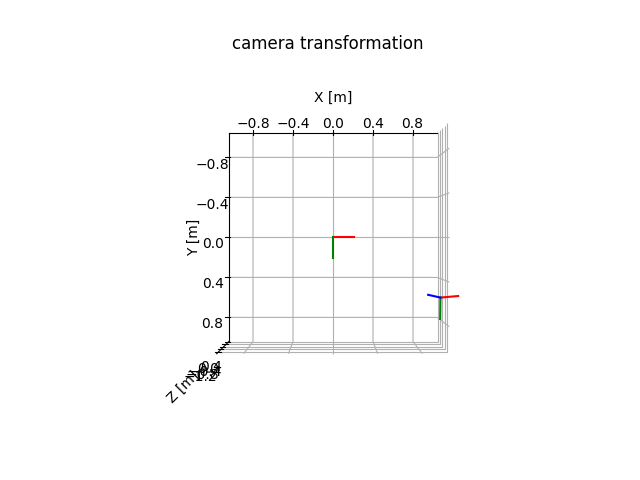

In [17]:
# Plot 3D Axes

plt.figure()
ax = make_3d_axis(1, 111, unit="m")

# Plot Origin
ax = pr.plot_basis(ax, s=0.2)

# Plot Chest Cam
ax = pr.plot_basis(ax, T[:3,:3], T[:3,-1], s=0.2)


ax.view_init(elev=-90, azim=-90)
ax.set_title("camera transformation")

ax.set_zlim([-1.5, 0.5])

# Chest Corners Detection and Transformation

In [18]:
# Example

chest_img = filt_df['chest_img'][0]
depth_img = filt_df['depth_img'][0]

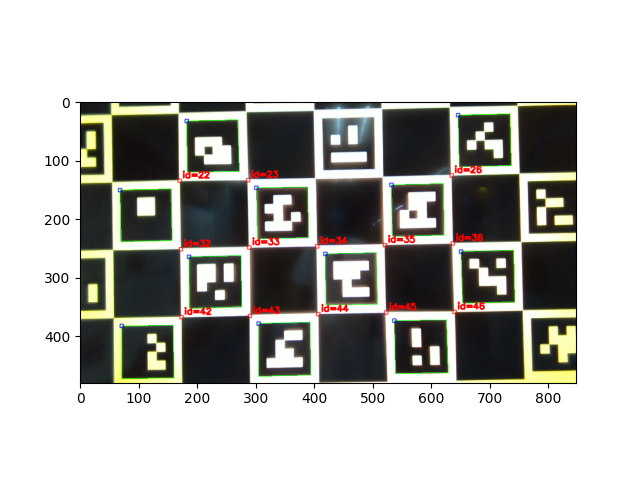

In [19]:
# Plot Charuco Image
plt.figure()
chest_disp = plot_charuco(chest_img, chest_cam_camera_mtx, chest_cam_dist_coef)
plt.imshow(chest_disp)

In [20]:
# Transformation for the shifting of the center

T_chest_cam_ctr = np.eye(4)
# T_chest_cam_ctr[0, -1] = -0.0325  # chest rgb to module center, 32.5 mm
T_chest_cam_ctr

array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]])

In [21]:
# Transformation: Board to Chest Image

T_chest = get_charuco_camera_pose(chest_img, chest_cam_camera_mtx, chest_cam_dist_coef)

In [22]:
T_chest

array([[ 0.99980917, -0.01949305,  0.00128261,  1.00392842],
       [ 0.01950848,  0.99972018, -0.01337827,  0.78323412],
       [-0.00102147,  0.01340074,  0.99990968, -1.00325651],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

# 2nd Filtering: RMSE and Motion Blur

## Left Eye

In [23]:
# Board to Left Eye Camera

img_left_list = filt_df['left_eye_img'].tolist()
T_left_list = []
for img in img_left_list:
    T_left_list.append(get_charuco_camera_pose(img, left_eye_camera_mtx, left_eye_dist_coef))
filt_df['T_bl'] = T_left_list

In [24]:
rmse_left_list = []
for img in img_left_list:
    rmse_left_list.append(get_charuco_rmse_pose(img, left_eye_camera_mtx, left_eye_dist_coef))
filt_df['rmse_left'] = rmse_left_list

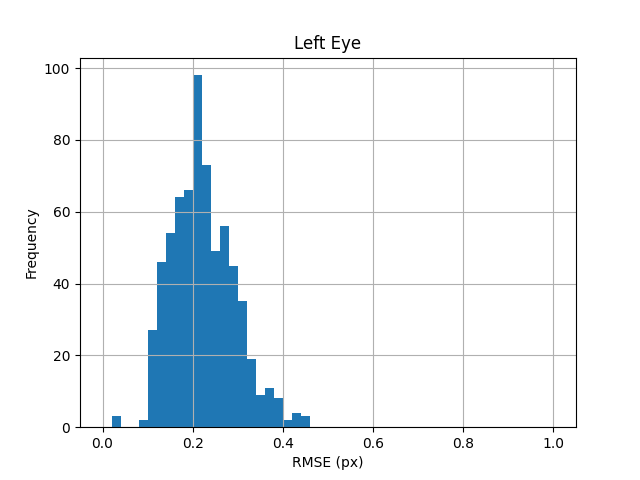

In [25]:
# Before Thresholding

plt.figure()
plt.hist(rmse_left_list, range=(0,1), bins=50)
plt.xlabel('RMSE (px)')
plt.ylabel('Frequency')
plt.title('Left Eye')
plt.grid()

In [26]:
# Remove Bad Batch

filt_df = filt_df.drop(filt_df[filt_df['rmse_left'] > 0.5].index).reset_index(drop=True)
filt_df.head()

,chess_idx,theta_left_pan,theta_right_pan,theta_tilt,chest_cam_px_x_tminus1,chest_cam_px_y_tminus1,left_eye_px_x_tminus1,left_eye_px_y_tminus1,right_eye_px_x_tminus1,right_eye_px_y_tminus1,...,plan_phi_right_pan_tminus2,plan_phi_tilt_tminus2,plan_phi_left_pan_tminus1,plan_phi_right_pan_tminus1,plan_phi_tilt_tminus1,phi_direction_left_pan,phi_direction_right_pan,phi_direction_tilt,T_bl,rmse_left
0,8,-14.150391,-14.238281,15.205078,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,0.0,0.0,3,3,3,"[[0.8496642568433785, -0.006370832228179331, -...",0.284411
1,4,-11.953125,-12.128906,15.117188,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,0.0,0.0,3,3,3,"[[0.8797303898528696, -0.007331321822958955, -...",0.346411
2,0,-9.931641,-10.107422,15.117188,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,0.0,0.0,3,3,3,"[[0.9076241652638624, -0.0046817907354212, -0....",0.289473
3,4,-8.173828,-8.085938,15.205078,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,0.0,0.0,3,3,3,"[[0.9244715766629092, -0.006687795548843354, -...",0.130017
4,8,-6.416016,-6.064453,15.205078,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,0.0,0.0,3,3,3,"[[0.9408614495630192, -0.006806923911706308, -...",0.316459


## Right Eye

In [27]:
img_right_list = filt_df['right_eye_img'].tolist()
T_right_list = []
for img in img_right_list:
    T_right_list.append(get_charuco_camera_pose(img, right_eye_camera_mtx, right_eye_dist_coef))
filt_df['T_br'] = T_right_list

In [28]:
rmse_right_list = []
for img in img_right_list:
    rmse_right_list.append(get_charuco_rmse_pose(img, right_eye_camera_mtx, right_eye_dist_coef))
filt_df['rmse_right'] = rmse_right_list 

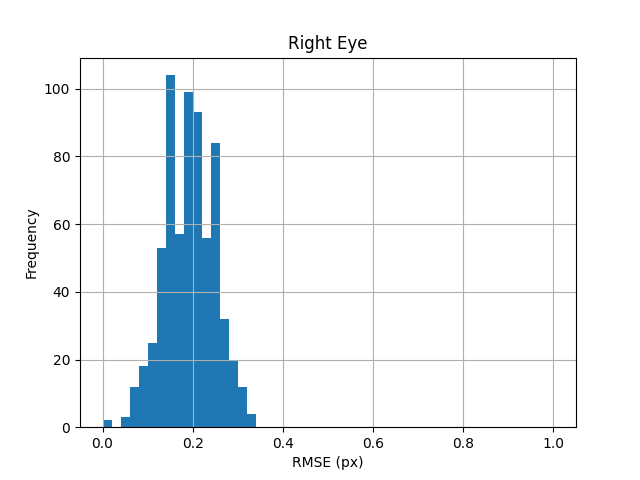

In [29]:
plt.figure()
plt.hist(rmse_right_list, range=(0,1), bins=50)
plt.xlabel('RMSE (px)')
plt.ylabel('Frequency')
plt.title('Right Eye')
plt.grid()

In [30]:
# Remove Bad Batch

filt_df = filt_df.drop(filt_df[filt_df['rmse_right'] > 0.5].index).reset_index(drop=True)
filt_df.head()

,chess_idx,theta_left_pan,theta_right_pan,theta_tilt,chest_cam_px_x_tminus1,chest_cam_px_y_tminus1,left_eye_px_x_tminus1,left_eye_px_y_tminus1,right_eye_px_x_tminus1,right_eye_px_y_tminus1,...,plan_phi_left_pan_tminus1,plan_phi_right_pan_tminus1,plan_phi_tilt_tminus1,phi_direction_left_pan,phi_direction_right_pan,phi_direction_tilt,T_bl,rmse_left,T_br,rmse_right
0,8,-14.150391,-14.238281,15.205078,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,3,3,3,"[[0.8496642568433785, -0.006370832228179331, -...",0.284411,"[[0.9782257505575288, 0.008557410855172233, -0...",0.176588
1,4,-11.953125,-12.128906,15.117188,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,3,3,3,"[[0.8797303898528696, -0.007331321822958955, -...",0.346411,"[[0.9912537803162296, 0.011076049822331215, -0...",0.152415
2,0,-9.931641,-10.107422,15.117188,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,3,3,3,"[[0.9076241652638624, -0.0046817907354212, -0....",0.289473,"[[0.9965460536675798, 0.015263243260123072, -0...",0.211841
3,4,-8.173828,-8.085938,15.205078,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,3,3,3,"[[0.9244715766629092, -0.006687795548843354, -...",0.130017,"[[0.9994383745044023, 0.016329490735694722, -0...",0.188341
4,8,-6.416016,-6.064453,15.205078,424,240,-360.6,-224.7,-222.3,-235.9,...,0.0,0.0,0.0,3,3,3,"[[0.9408614495630192, -0.006806923911706308, -...",0.316459,"[[0.9994986895111042, 0.01800052703556533, 0.0...",0.110793


## Summary

In [31]:
# Unique Values

print(filt_df['theta_left_pan_cmd_tminus1'].unique())
print(filt_df['theta_right_pan_cmd_tminus1'].unique())
print(filt_df['theta_tilt_cmd_tminus1'].unique())

[-14 -12 -10  -8  -6  -4  -2   0   2   4   6   8  10  12  14]
[-14 -12 -10  -8  -6  -4  -2   0   2   4   6   8  10  12  14]
[ 15  10   5   0  -5 -10 -15 -20 -25]


In [32]:
# Left Eye

combined_counts = filt_df.groupby(['theta_tilt_cmd_tminus1','theta_left_pan_cmd_tminus1']).size().reset_index(name='count')
df = pd.DataFrame(combined_counts)
pd.set_option('display.max_rows', None)
df

,theta_tilt_cmd_tminus1,theta_left_pan_cmd_tminus1,count
0,-25,-14,5
1,-25,-12,5
2,-25,-10,5
3,-25,-8,5
4,-25,-6,5
5,-25,-4,5
6,-25,-2,5
7,-25,0,5
8,-25,2,5
9,-25,4,5


In [33]:
# Right Eye

combined_counts = filt_df.groupby(['theta_tilt_cmd_tminus1', 'theta_right_pan_cmd_tminus1']).size().reset_index(name='count')
df = pd.DataFrame(combined_counts)
pd.set_option('display.max_rows', None)
df

,theta_tilt_cmd_tminus1,theta_right_pan_cmd_tminus1,count
0,-25,-14,5
1,-25,-12,5
2,-25,-10,5
3,-25,-8,5
4,-25,-6,5
5,-25,-4,5
6,-25,-2,5
7,-25,0,5
8,-25,2,5
9,-25,4,5


# World Points Deprojection

## Example

In [34]:
# Left Eye

gx_left = calib_params['left_eye']['x_center']
gy_left = calib_params['left_eye']['y_center']

# Undistort Points
gx_left_prime, gy_left_prime = cv2.undistortPoints((gx_left,gy_left), 
                                                   left_eye_camera_mtx, 
                                                   left_eye_dist_coef, 
                                                   P=left_eye_camera_mtx).squeeze()

fx_left = left_eye_camera_mtx[0][0]
cx_left = left_eye_camera_mtx[0][2]
fy_left = left_eye_camera_mtx[1][1]
cy_left = left_eye_camera_mtx[1][2]

print('gx_left:', gx_left)
print('gx_left_prime:', gx_left_prime)
print('cx_left:',cx_left)
print('gy_left:',gy_left)
print('gy_left_prime:', gy_left_prime)
print('cy_left',cy_left)

gx_left: 411
gx_left_prime: 410.7341213903983
cx_left: 302.45664072
gy_left: 235
gy_left_prime: 235.075708381705
cy_left 215.54188413


### Normalized Camera Coordinates

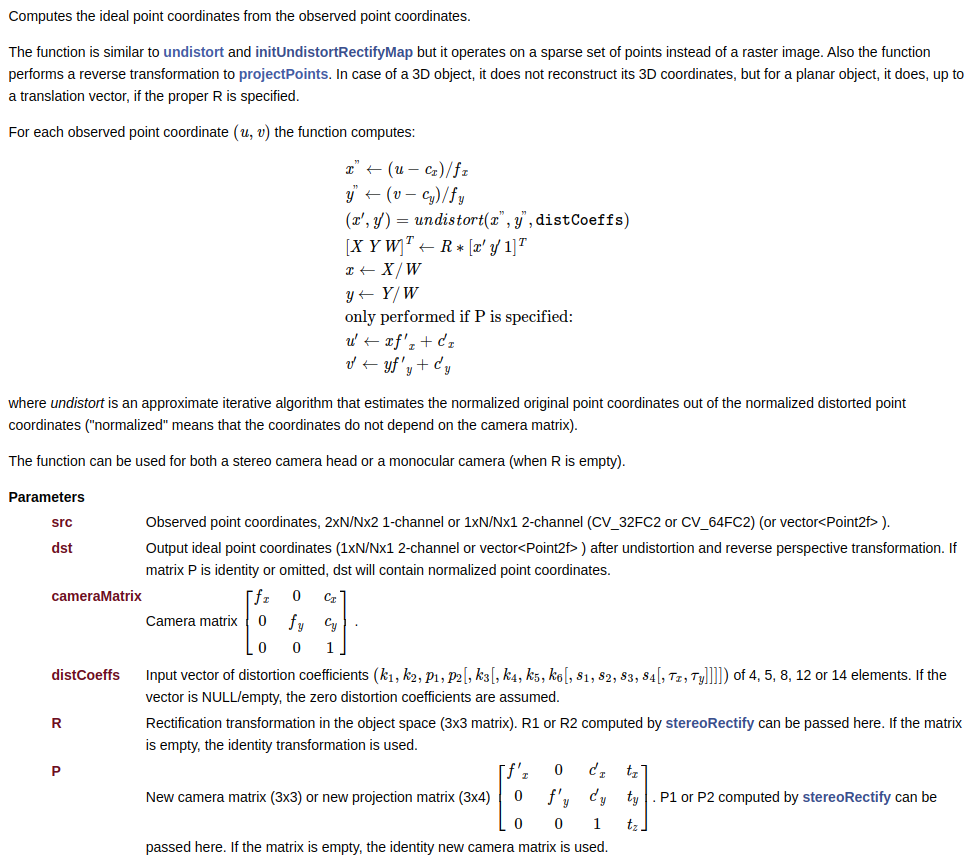

In [35]:
# Get Normalized Camera Coordinates
x_prime, y_prime = cv2.undistortPoints((gx_left,gy_left),   # x' = X_C/Z_C
                    left_eye_camera_mtx,                    # y' = Y_C/Z_C
                    left_eye_dist_coef).squeeze()
x_prime, y_prime 

(0.19142607185001126, 0.034590406011504184)

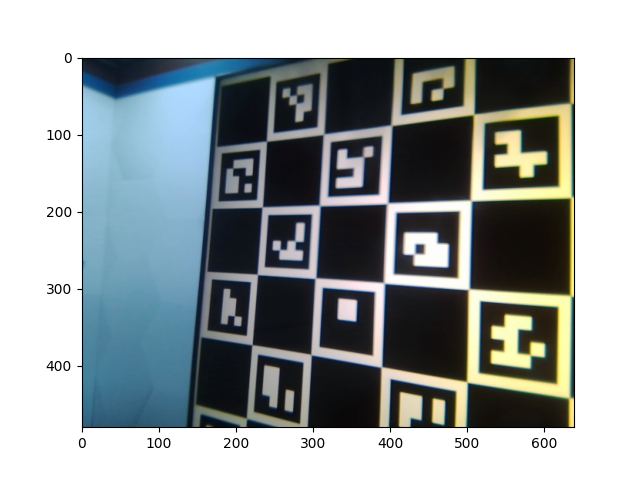

In [36]:
# Input
img = copy.deepcopy(img_left_list[0])
camera_mtx = copy.deepcopy(left_eye_camera_mtx)
dist_coef = copy.deepcopy(left_eye_dist_coef)

plt.figure()
plt.imshow(img)

### Charuco Pose Estimation

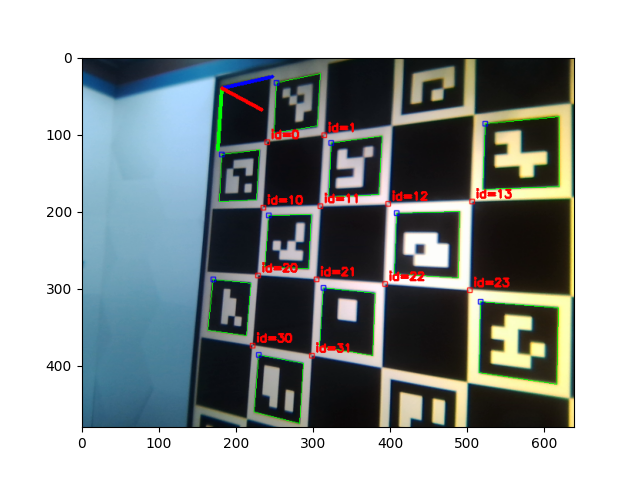

In [37]:
# Charuco and Marker Detection

image_copy = copy.deepcopy(img)
charuco_corners, charuco_ids, marker_corners, marker_ids = attention.charuco_detector.detectBoard(img)
if not (marker_ids is None) and len(marker_ids) > 0:
    aruco.drawDetectedMarkers(image_copy, marker_corners)
if not (charuco_ids is None) and len(charuco_ids) > 0:
    aruco.drawDetectedCornersCharuco(image_copy, charuco_corners, charuco_ids)
    if len(camera_mtx) > 0 and len(charuco_ids) >= 4:
        try:
            obj_points, img_points = attention.board.matchImagePoints(charuco_corners, charuco_ids)
            flag, rvec, tvec = cv2.solvePnP(obj_points, img_points, camera_mtx, dist_coef)
            if flag:
                cv2.drawFrameAxes(image_copy, camera_mtx, dist_coef, rvec, tvec, .2)
        except cv2.error as error_inst:
            print("SolvePnP recognize calibration pattern as non-planar pattern. To process this need to use "
                  "minimum 6 points. The planar pattern may be mistaken for non-planar if the pattern is "
                  "deformed or incorrect camera parameters are used.")
            print(error_inst.err)
plt.figure()
plt.imshow(image_copy)

In [38]:
# Resulting Pose
print(rvec)
print(tvec)

[[-0.11733837]
 [ 0.555133  ]
 [ 0.02674735]]
[[-0.29443001]
 [-0.42879425]
 [ 1.41234199]]


In [39]:
# Convert the rotation vector to a rotation matrix
rotation_matrix, _ = cv2.Rodrigues(rvec)

# Homogeneous Coordinates
H = np.eye(4)
H[:3,:3] = rotation_matrix
H[:3,-1] = tvec.T

print(H)

[[ 0.84966426 -0.05703485  0.52423056 -0.29443001]
 [-0.00637083  0.99295078  0.11835607 -0.42879425]
 [-0.52728556 -0.10390271  0.84331143  1.41234199]
 [ 0.          0.          0.          1.        ]]


In [40]:
# Comparison with Inverse of T_bl

T = np.linalg.inv(filt_df['T_bl'][0])

print(T)
print(np.allclose(H,T))

[[ 0.84966426 -0.05703485  0.52423056 -0.29443001]
 [-0.00637083  0.99295078  0.11835607 -0.42879425]
 [-0.52728556 -0.10390271  0.84331143  1.41234199]
 [ 0.          0.          0.          1.        ]]
True


### Solving System of Linear Equations

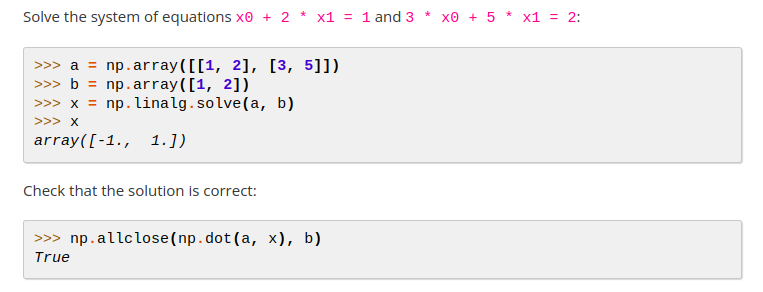

In [41]:
a = np.array([[T[0,0],T[0,1],-x_prime], 
              [T[1,0],T[1,1],-y_prime],
              [T[2,0],T[2,1],-1.0],
             ])
a

array([[ 0.84966426, -0.05703485, -0.19142607],
       [-0.00637083,  0.99295078, -0.03459041],
       [-0.52728556, -0.10390271, -1.        ]])

In [42]:
b = np.array([-T[0,3],-T[1,3],-T[2,3]])
b

array([ 0.29443001,  0.42879425, -1.41234199])

In [43]:
x = np.linalg.solve(a,b)  # X_W, Y_W, Z_C
x

array([0.61258325, 0.47200835, 1.04029274])

In [44]:
np.allclose(np.dot(a,x),b)

True

In [45]:
world_pts = (x[0],x[1],0)  # X_W, Y_W, Z_W
u,v = cv2.projectPoints(world_pts, rvec, tvec, camera_mtx, dist_coef)[0].squeeze()
u,v

(410.9999999999998, 235.0)

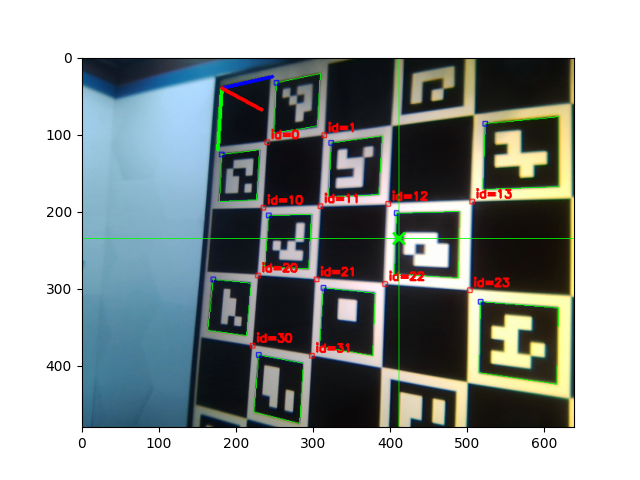

In [46]:
# Plotting

img_copy = copy.deepcopy(image_copy)
# True Optical Center
img_copy = cv2.line(img_copy, (round(gx_left), 0), (round(gx_left), 480), (0,255,0))
img_copy = cv2.line(img_copy, (0, round(gy_left)), (848, round(gy_left)), (0,255,0))
# img_copy = cv2.drawMarker(img_copy, (round(gx_left), round(gy_left)), color=(0, 255, 0), markerType=cv2.MARKER_CROSS, markerSize=15,thickness=2)
img_copy = cv2.drawMarker(img_copy, (round(u), round(v)), color=(0, 255, 0), 
                                     markerType=cv2.MARKER_TILTED_CROSS, markerSize=15, thickness=2)
plt.figure()
plt.imshow(img_copy)

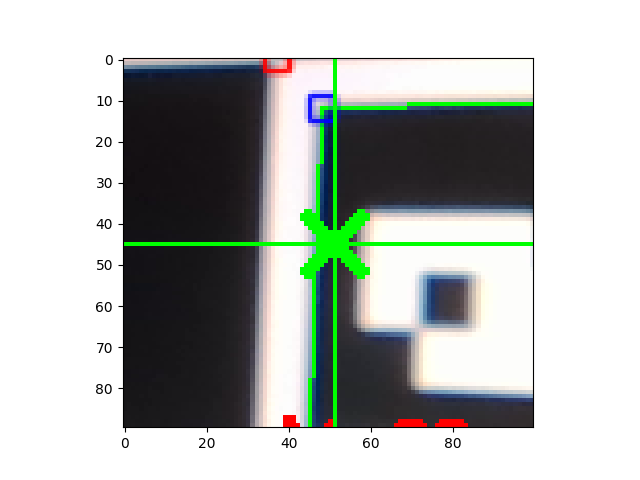

In [47]:
# Zoomed Plot

plt.figure()
plt.imshow(img_copy[190:280,360:460])

In [48]:
# Difference 

np.array([u,v]) - np.array([gx_left,gy_left])

array([-2.27373675e-13,  0.00000000e+00])

## Left Eye

In [49]:
left_world_pts_list = []
for T_bl in filt_df['T_bl']:
    left_world_pts_list.append(get_world_deproject('left_eye', 
                                                   left_eye_camera_mtx, 
                                                   left_eye_dist_coef, 
                                                   T_bl))
filt_df['left_world_pts'] = left_world_pts_list

## Right Eye

In [50]:
right_world_pts_list = []
for T_br in filt_df['T_br']:
    right_world_pts_list.append(get_world_deproject('right_eye', 
                                                    right_eye_camera_mtx, 
                                                    right_eye_dist_coef, 
                                                    T_br))
filt_df['right_world_pts'] = right_world_pts_list

## Target Comparison of Left and Right Eye 0 Position

In [51]:
zero_df = filt_df[(filt_df['theta_tilt_cmd_tminus1']==0) 
                  & (filt_df['theta_left_pan_cmd_tminus1']==0)
                  & (filt_df['theta_right_pan_cmd_tminus1']==0)].reset_index()

In [52]:
zero_df['left_world_pts'][:5]

0     [1.0036338280157693, 0.565494561558829, 0.0]
1    [1.0046051494770212, 0.5655800596777829, 0.0]
2    [1.0046341433619135, 0.5656225679650677, 0.0]
3    [1.0044452217771953, 0.5658542457961329, 0.0]
4     [1.005250757010345, 0.5656204584779726, 0.0]
Name: left_world_pts, dtype: object

In [53]:
zero_df['right_world_pts'][:5]

0      [0.9997192921176548, 0.56691994995271, 0.0]
1     [1.000032938357652, 0.5668627875911191, 0.0]
2    [0.9985150470331281, 0.5670244122911351, 0.0]
3    [0.9994942787733065, 0.5670937522352516, 0.0]
4    [0.9998642394057164, 0.5668229652589968, 0.0]
Name: right_world_pts, dtype: object

In [54]:
# Error Gathering

error_arr = np.stack((zero_df['left_world_pts'] - zero_df['right_world_pts']).values, axis=0)
error_arr

array([[ 0.00391454, -0.00142539,  0.        ],
       [ 0.00457221, -0.00128273,  0.        ],
       [ 0.0061191 , -0.00140184,  0.        ],
       [ 0.00495094, -0.00123951,  0.        ],
       [ 0.00538652, -0.00120251,  0.        ]])

In [55]:
# Standard Deviation (mm)
std_mm = np.std(error_arr[:,0])*1000
print('error std: %.4f mm' % std_mm)

error std: 0.7436 mm


# Projection to Chest Camera Image

## Zero Position of Motors

In [56]:
# Left Eye Projection
left_zero_u_list = []
left_zero_v_list = []
for world_pts in zero_df['left_world_pts']:
    u,v = get_chest_cam_proj(world_pts, T_chest)
    left_zero_u_list.append(u)
    left_zero_v_list.append(v)

In [57]:
# Right Eye Projection
right_zero_u_list = []
right_zero_v_list = []
for world_pts in zero_df['right_world_pts']:
    u,v = get_chest_cam_proj(world_pts, T_chest)
    right_zero_u_list.append(u)
    right_zero_v_list.append(v)

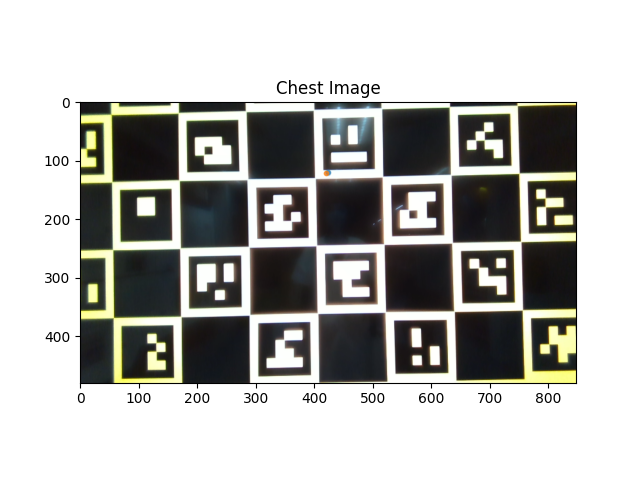

In [58]:
# Plotting

img_copy = copy.deepcopy(chest_img)
plt.figure()
plt.title('Chest Image')
plt.imshow(img_copy)
plt.scatter(left_zero_u_list, left_zero_v_list, color=colors[0], marker='.', alpha=0.2)
plt.scatter(right_zero_u_list, right_zero_v_list, color=colors[1], marker='.', alpha=0.2)
plt.show()

## Left Eye Projections

In [59]:
# Left Eye Projection
left_u_list = []
left_v_list = []
for world_pts in filt_df['left_world_pts']:
    u,v = get_chest_cam_proj(world_pts, T_chest)
    left_u_list.append(u)
    left_v_list.append(v)

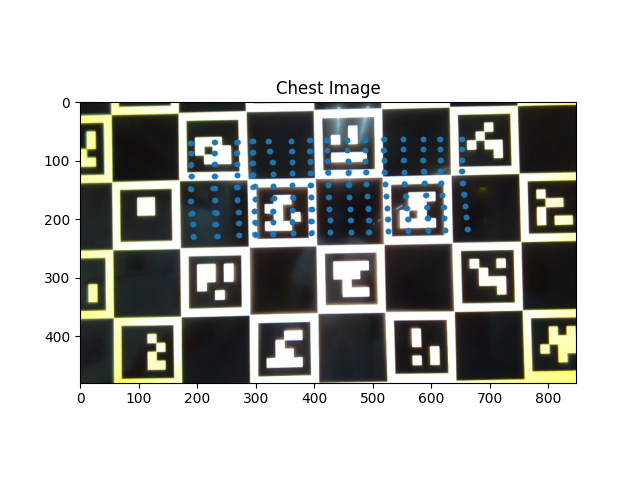

In [60]:
# Plotting

img_copy = copy.deepcopy(chest_img)
plt.figure()
plt.title('Chest Image')
plt.imshow(img_copy)
plt.scatter(left_u_list, left_v_list, color=colors[0], marker='.', alpha=0.5)
plt.show()

## Right Eye Projections

In [61]:
# Right Eye Projection
right_u_list = []
right_v_list = []
for world_pts in filt_df['right_world_pts']:
    u,v = get_chest_cam_proj(world_pts, T_chest)
    right_u_list.append(u)
    right_v_list.append(v)

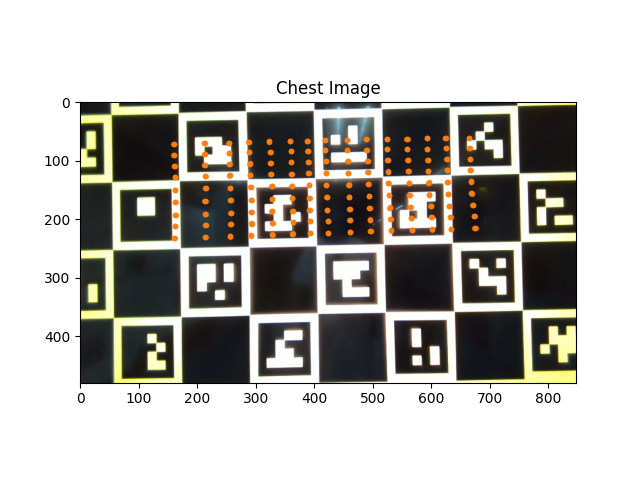

In [62]:
# Plotting

img_copy = copy.deepcopy(chest_img)
plt.figure()
plt.title('Chest Image')
plt.imshow(img_copy)
plt.scatter(right_u_list, right_v_list, color=colors[1], marker='.', alpha=0.5)
plt.show()

## Left and Right Projections

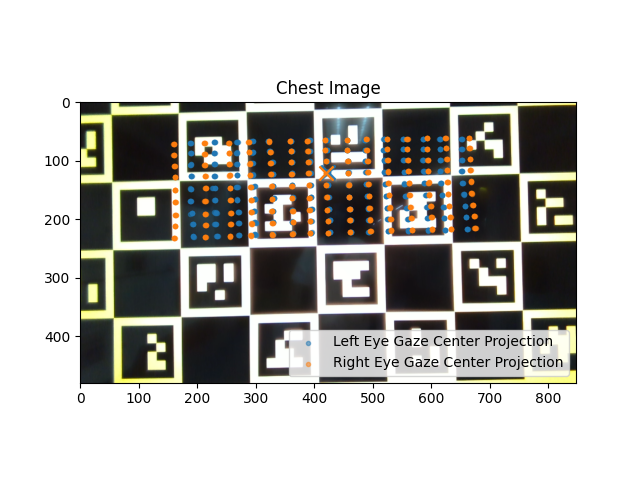

In [63]:
# Plotting

img_copy = copy.deepcopy(chest_img)
plt.figure()
plt.title('Chest Image')
plt.imshow(img_copy)
plt.scatter(left_u_list, left_v_list, color=colors[0], marker='.', alpha=0.5)
plt.scatter(right_u_list, right_v_list, color=colors[1], marker='.', alpha=0.5)
plt.scatter(left_zero_u_list, left_zero_v_list, color=colors[0], marker='x', s=100, alpha=0.5)
plt.scatter(right_zero_u_list, right_zero_v_list, color=colors[1], marker='x', s=100, alpha=0.5)
plt.legend(['Left Eye Gaze Center Projection', 'Right Eye Gaze Center Projection'], loc='lower right')
plt.show()

# Single Image Comparison

## Left Image 1

In [88]:
eye = 'left_eye'

In [89]:
gx = calib_params[eye]['x_center']
gy = calib_params[eye]['y_center']

In [90]:
img_left_list = filt_df['left_eye_img'].tolist()

left_img = copy.deepcopy(img_left_list[0])
img_copy = copy.deepcopy(left_img)
img_copy = cv2.line(img_copy, (round(gx), 0), (round(gx), 480), (255,0,0))
img_copy = cv2.line(img_copy, (0, round(gy)), (848, round(gy)), (255,0,0))
img_copy = cv2.drawMarker(img_copy, (round(gx), round(gy)), color=(255,0,0), 
                          markerType=cv2.MARKER_CROSS, markerSize=15, thickness=2)

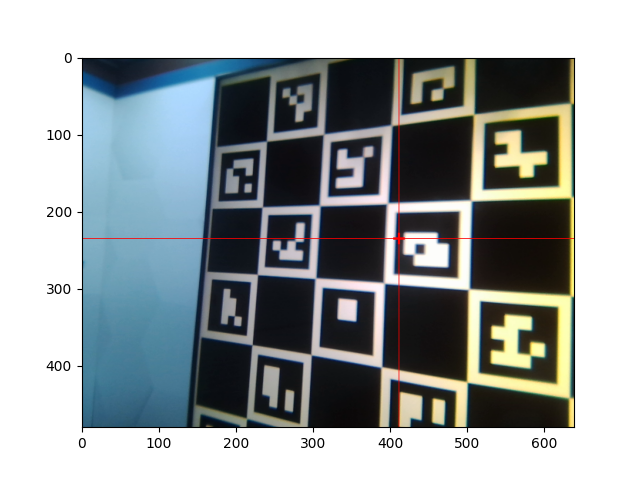

In [91]:
plt.figure()
plt.imshow(img_copy)

## Left Image 2

In [92]:
eye = 'left_eye'

In [93]:
gx = calib_params[eye]['x_center']
gy = calib_params[eye]['y_center']

In [94]:
img_left_list = filt_df['left_eye_img'].tolist()

left_img = copy.deepcopy(img_left_list[7])
img_copy = copy.deepcopy(left_img)
img_copy = cv2.line(img_copy, (round(gx), 0), (round(gx), 480), (0,255,0))
img_copy = cv2.line(img_copy, (0, round(gy)), (848, round(gy)), (0,255,0))
img_copy = cv2.drawMarker(img_copy, (round(gx), round(gy)), color=(0, 255, 0), 
                          markerType=cv2.MARKER_CROSS, markerSize=15, thickness=2)

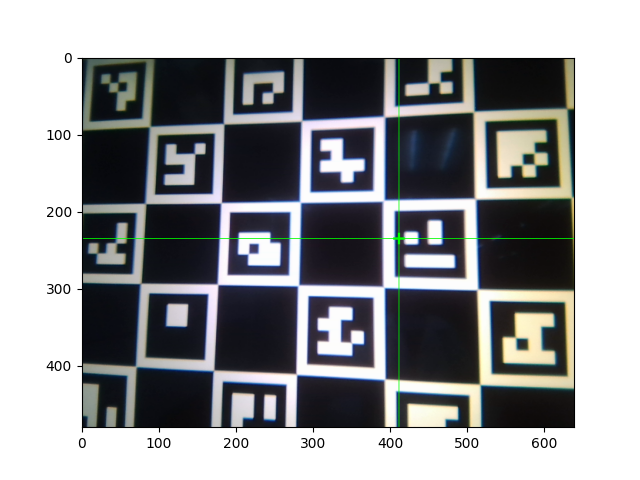

In [95]:
plt.figure()
plt.imshow(img_copy)

## Left Image 3

In [96]:
eye = 'left_eye'

In [97]:
gx = calib_params[eye]['x_center']
gy = calib_params[eye]['y_center']

In [98]:
img_left_list = filt_df['left_eye_img'].tolist()

left_img = copy.deepcopy(img_left_list[14])
img_copy = copy.deepcopy(left_img)
img_copy = cv2.line(img_copy, (round(gx), 0), (round(gx), 480), (0,0,255))
img_copy = cv2.line(img_copy, (0, round(gy)), (848, round(gy)), (0,0,255))
img_copy = cv2.drawMarker(img_copy, (round(gx), round(gy)), color=(0,0,255), 
                          markerType=cv2.MARKER_CROSS, markerSize=15, thickness=2)

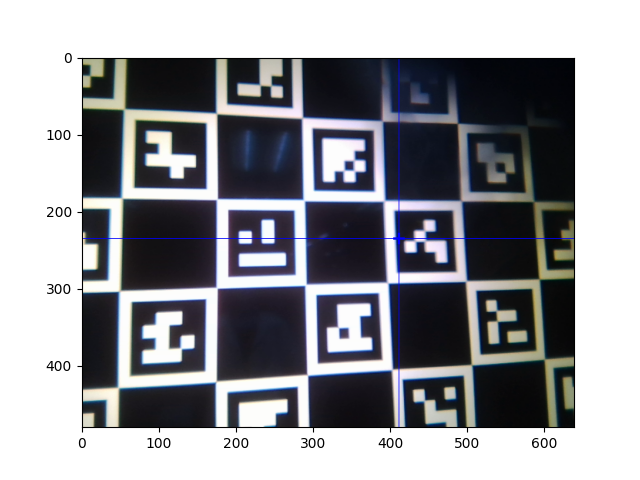

In [99]:
plt.figure()
plt.imshow(img_copy)

## Left Chest Image

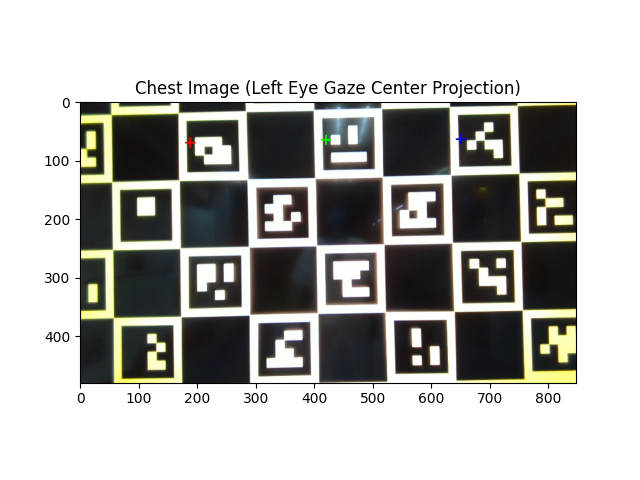

In [100]:
# Plotting

img_copy = copy.deepcopy(chest_img)
plt.figure()
plt.title('Chest Image (Left Eye Gaze Center Projection)')
img_copy = cv2.drawMarker(img_copy, (round(left_u_list[0]), round(left_v_list[0])), color=(255,0,0), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
img_copy = cv2.drawMarker(img_copy, (round(left_u_list[7]), round(left_v_list[7])), color=(0, 255, 0), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
img_copy = cv2.drawMarker(img_copy, (round(left_u_list[14]), round(left_v_list[14])), color=(0,0,255), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
plt.imshow(img_copy)
plt.show()

## Right Image 1

In [105]:
eye = 'right_eye'

In [106]:
gx = calib_params[eye]['x_center']
gy = calib_params[eye]['y_center']

In [107]:
img_right_list = filt_df['right_eye_img'].tolist()

right_img = copy.deepcopy(img_right_list[0])
img_copy = copy.deepcopy(right_img)
img_copy = cv2.line(img_copy, (round(gx), 0), (round(gx), 480), (255,0,0))
img_copy = cv2.line(img_copy, (0, round(gy)), (848, round(gy)), (255,0,0))
img_copy = cv2.drawMarker(img_copy, (round(gx), round(gy)), color=(255,0,0), 
                          markerType=cv2.MARKER_CROSS, markerSize=15, thickness=2)

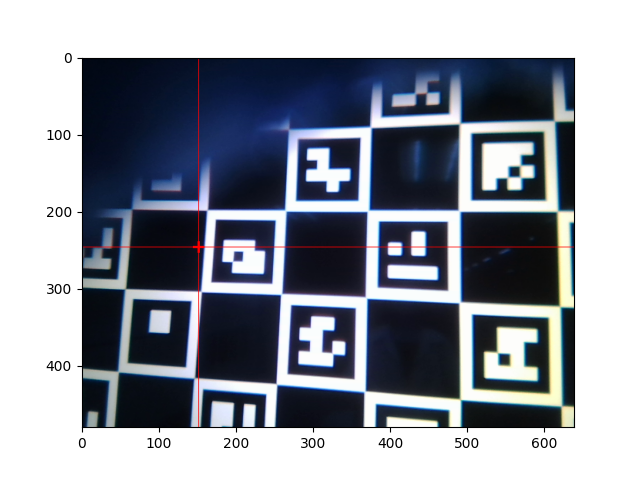

In [108]:
plt.figure()
plt.imshow(img_copy)

## Right Image 2

In [109]:
eye = 'right_eye'

In [110]:
gx = calib_params[eye]['x_center']
gy = calib_params[eye]['y_center']

In [111]:
img_right_list = filt_df['right_eye_img'].tolist()

right_img = copy.deepcopy(img_right_list[7])
img_copy = copy.deepcopy(right_img)
img_copy = cv2.line(img_copy, (round(gx), 0), (round(gx), 480), (0,255,0))
img_copy = cv2.line(img_copy, (0, round(gy)), (848, round(gy)), (0,255,0))
img_copy = cv2.drawMarker(img_copy, (round(gx), round(gy)), color=(0,255,0), 
                          markerType=cv2.MARKER_CROSS, markerSize=15, thickness=2)

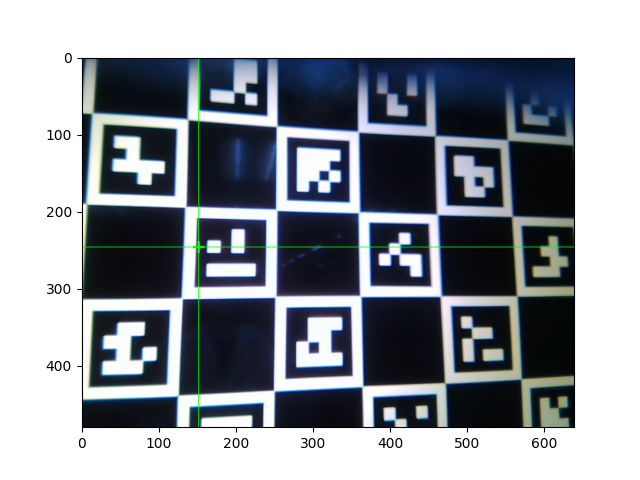

In [112]:
plt.figure()
plt.imshow(img_copy)

## Right Image 3

In [113]:
eye = 'right_eye'

In [114]:
gx = calib_params[eye]['x_center']
gy = calib_params[eye]['y_center']

In [115]:
img_right_list = filt_df['right_eye_img'].tolist()

right_img = copy.deepcopy(img_right_list[14])
img_copy = copy.deepcopy(right_img)
img_copy = cv2.line(img_copy, (round(gx), 0), (round(gx), 480), (0,0,255))
img_copy = cv2.line(img_copy, (0, round(gy)), (848, round(gy)), (0,0,255))
img_copy = cv2.drawMarker(img_copy, (round(gx), round(gy)), color=(0,0,255), 
                          markerType=cv2.MARKER_CROSS, markerSize=15, thickness=2)

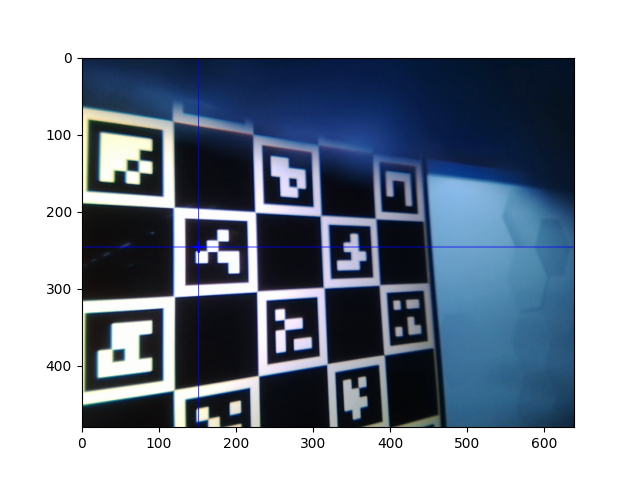

In [116]:
plt.figure()
plt.imshow(img_copy)

## Right Chest Image

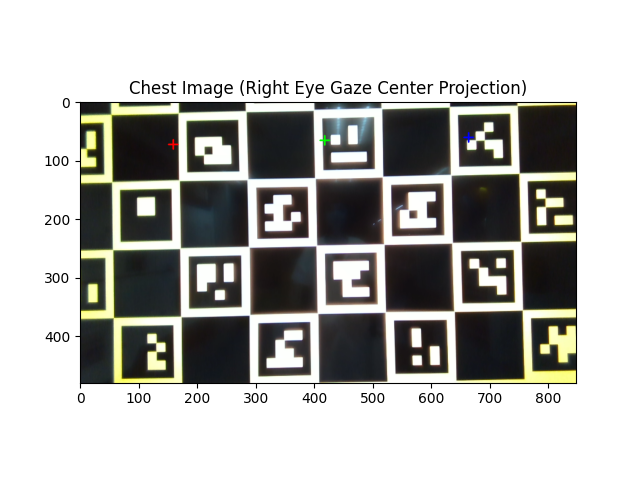

In [117]:
# Plotting

img_copy = copy.deepcopy(chest_img)
plt.figure()
plt.title('Chest Image (Right Eye Gaze Center Projection)')
img_copy = cv2.drawMarker(img_copy, (round(right_u_list[0]), round(right_v_list[0])), color=(255,0,0), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
img_copy = cv2.drawMarker(img_copy, (round(right_u_list[7]), round(right_v_list[7])), color=(0, 255, 0), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
img_copy = cv2.drawMarker(img_copy, (round(right_u_list[14]), round(right_v_list[14])), color=(0,0,255), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
plt.imshow(img_copy)
plt.show()

# Undistorted Homography Single Comparison

In [126]:
# Input

left_img = copy.deepcopy(img_left_list[0])
img1 = copy.deepcopy(left_img)
img2 = copy.deepcopy(chest_img)

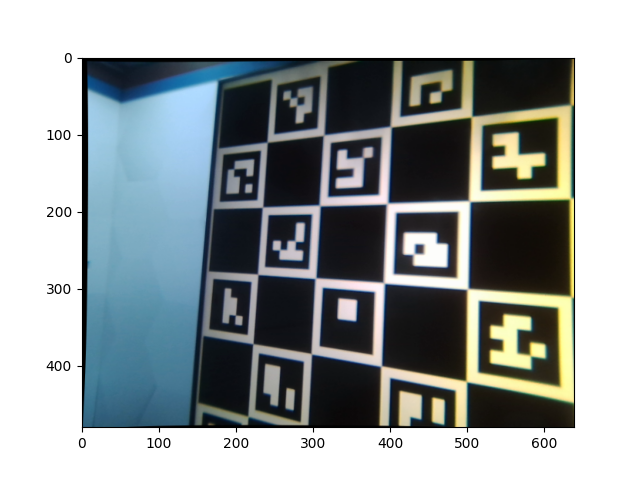

In [127]:
# Undistort Input Image 

img1 = cv2.undistort(img1, left_eye_camera_mtx, left_eye_dist_coef)
plt.figure()
plt.imshow(img1)

In [128]:
# Initialization
MIN_MATCH_COUNT = 10
FLANN_INDEX_KDTREE = 1
sift = cv2.SIFT_create()

# Conversion to Grayscale
img1_gray = cv2.cvtColor(copy.deepcopy(img1), cv2.COLOR_BGR2GRAY) 
img2_gray = cv2.cvtColor(copy.deepcopy(img2), cv2.COLOR_BGR2GRAY)

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1_gray,None)
kp2, des2 = sift.detectAndCompute(img2_gray,None)

# KNN Matching
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1,des2,k=2)

# store all the good matches as per Lowe's ratio test.
good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)

In [129]:
# Find Homography

if len(good)>MIN_MATCH_COUNT:
    # Source and Destination Points
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

    # Find perspective transformation between two planes.
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
    matchesMask = mask.ravel().tolist()

    # Source Image Border
    h,w = img1_gray.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)  # Transform pixel points from source to destination
    # img2_disp = cv2.polylines(copy.deepcopy(img2_gray),[np.int32(dst)],True,128,3, cv2.LINE_AA)
else:
    print( "Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
    matchesMask = None

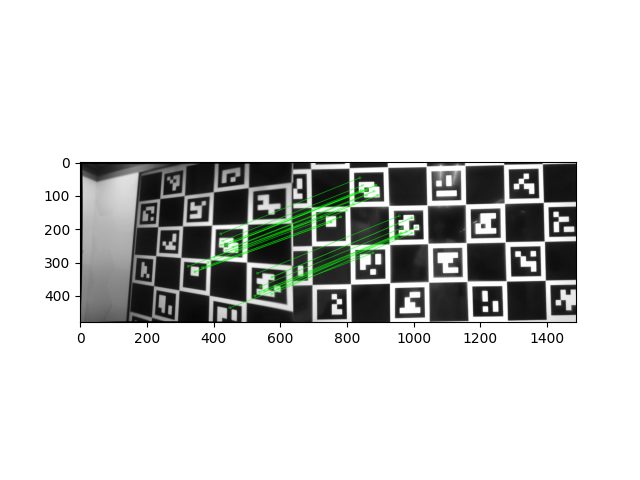

(<matplotlib.image.AxesImage at 0x7f1336334610>, None)

In [130]:
# Plot Matches

draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
img3 = cv2.drawMatches(img1_gray,kp1,
                       img2_gray,kp2,
                       good,None,**draw_params)
plt.figure()
plt.imshow(img3, 'gray'),plt.show()

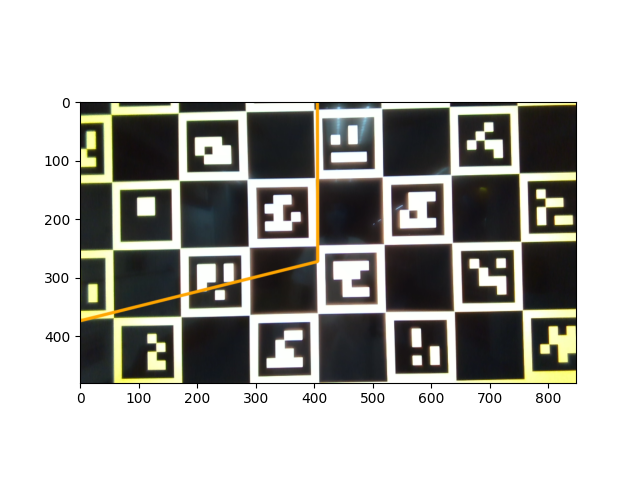

In [131]:
# Projection of Img1 border to Img2

img2_disp = cv2.polylines(copy.deepcopy(img2),[np.int32(dst)],True,(255,165,0),3, cv2.LINE_AA)
plt.figure()
plt.imshow(img2_disp)

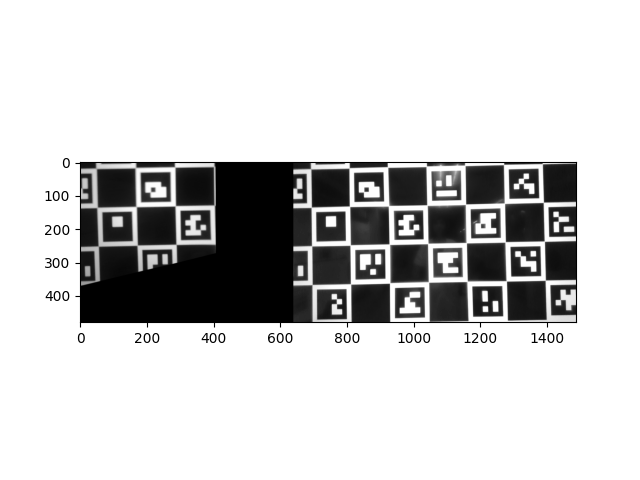

In [132]:
# Warp Perspective Comparison

img1_gray_warp = cv2.warpPerspective(img1_gray, M, (img1_gray.shape[1], img1_gray.shape[0]))
img_draw_warp = cv2.hconcat([img1_gray_warp, img2_gray])
plt.figure()
plt.imshow(img_draw_warp, 'gray')

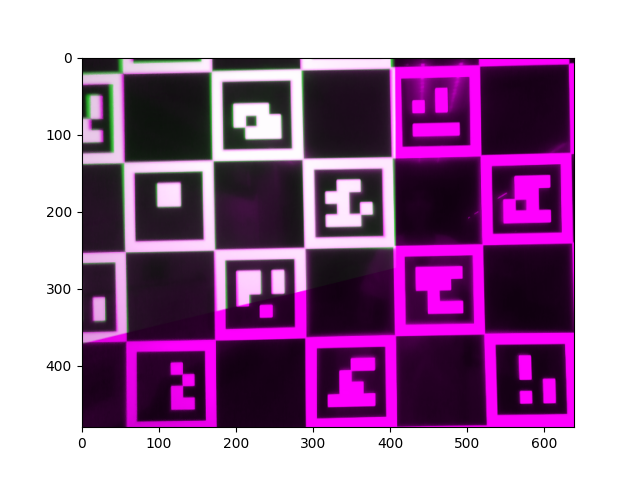

In [133]:
# Anaglyph
img2_gray_crop = img2_gray[:img1_gray.shape[0],:img1_gray.shape[1]]
disp_image = create_anaglyph_gray(img1_gray_warp, img2_gray_crop)
plt.figure()
plt.imshow(disp_image)

# Homography Anaglyphs Comparison

## Left Image 1

In [212]:
left_img = copy.deepcopy(img_left_list[0])
img1 = copy.deepcopy(left_img)
img2 = copy.deepcopy(chest_img)

In [213]:
# Processing
img1 = cv2.undistort(img1, left_eye_camera_mtx, left_eye_dist_coef)
img1_gray = cv2.cvtColor(copy.deepcopy(img1), cv2.COLOR_BGR2GRAY) 
img2_gray = cv2.cvtColor(copy.deepcopy(img2), cv2.COLOR_BGR2GRAY)

M1 = get_homography(img1, img2, left_eye_camera_mtx, left_eye_dist_coef)[0]
h,w = img1_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst1 = cv2.perspectiveTransform(pts,M1) 

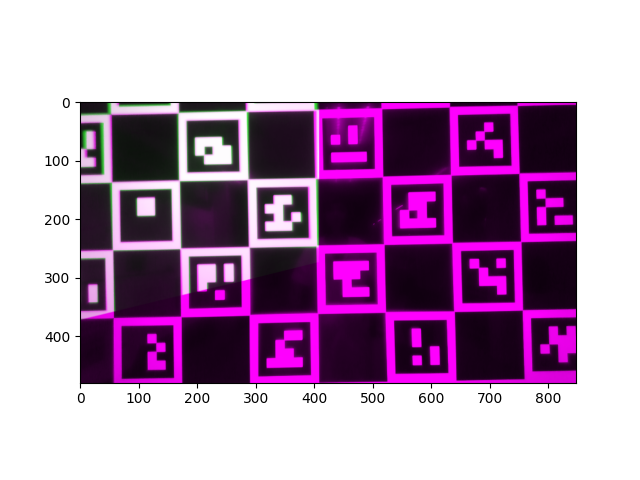

In [214]:
# Anaglyph 
img1_gray_warp = cv2.warpPerspective(img1_gray, M1, (img2_gray.shape[1], img2_gray.shape[0]))
disp_image = create_anaglyph_gray(img1_gray_warp, img2_gray)
plt.figure()
plt.imshow(disp_image)

## Left Image 2

In [215]:
left_img = copy.deepcopy(img_left_list[7])
img1 = copy.deepcopy(left_img)
img2 = copy.deepcopy(chest_img)

In [216]:
# Processing
img1 = cv2.undistort(img1, left_eye_camera_mtx, left_eye_dist_coef)
img1_gray = cv2.cvtColor(copy.deepcopy(img1), cv2.COLOR_BGR2GRAY) 
img2_gray = cv2.cvtColor(copy.deepcopy(img2), cv2.COLOR_BGR2GRAY)

M2 = get_homography(img1, img2, left_eye_camera_mtx, left_eye_dist_coef)[0]
h,w = img1_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst2 = cv2.perspectiveTransform(pts,M2) 

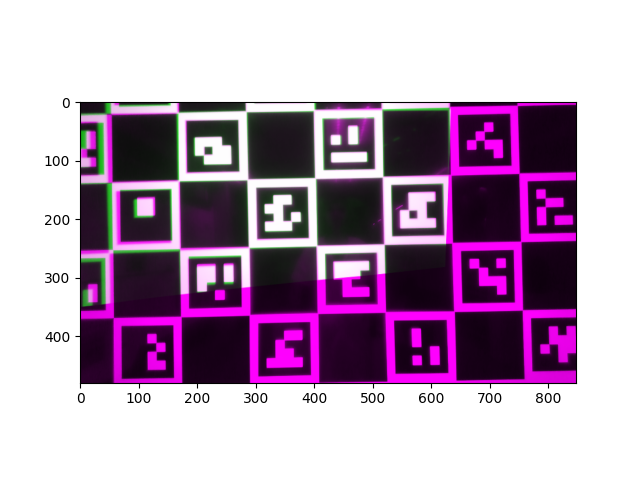

In [217]:
# Anaglyph 
img1_gray_warp = cv2.warpPerspective(img1_gray, M2, (img2_gray.shape[1], img2_gray.shape[0]))
disp_image = create_anaglyph_gray(img1_gray_warp, img2_gray)
plt.figure()
plt.imshow(disp_image)

## Left Image 3

In [218]:
left_img = copy.deepcopy(img_left_list[14])
img1 = copy.deepcopy(left_img)
img2 = copy.deepcopy(chest_img)

In [219]:
# Processing
img1 = cv2.undistort(img1, left_eye_camera_mtx, left_eye_dist_coef)
img1_gray = cv2.cvtColor(copy.deepcopy(img1), cv2.COLOR_BGR2GRAY) 
img2_gray = cv2.cvtColor(copy.deepcopy(img2), cv2.COLOR_BGR2GRAY)

M3 = get_homography(img1, img2, left_eye_camera_mtx, left_eye_dist_coef)[0]
h,w = img1_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst3 = cv2.perspectiveTransform(pts,M3) 

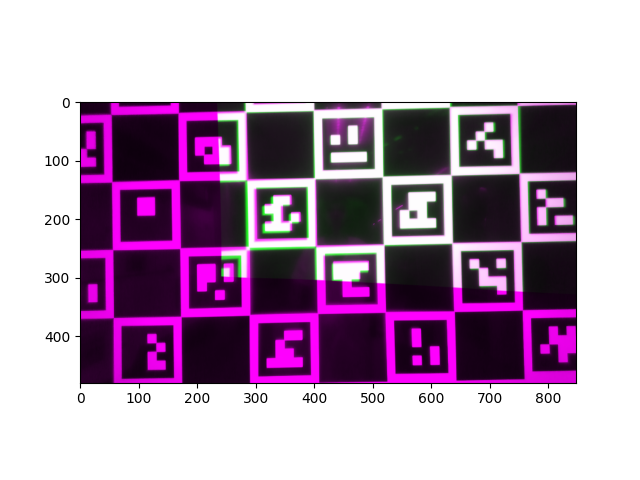

In [220]:
# Anaglyph 
img1_gray_warp = cv2.warpPerspective(img1_gray, M3, (img2_gray.shape[1], img2_gray.shape[0]))
disp_image = create_anaglyph_gray(img1_gray_warp, img2_gray)
plt.figure()
plt.imshow(disp_image)

## Left Chest Image

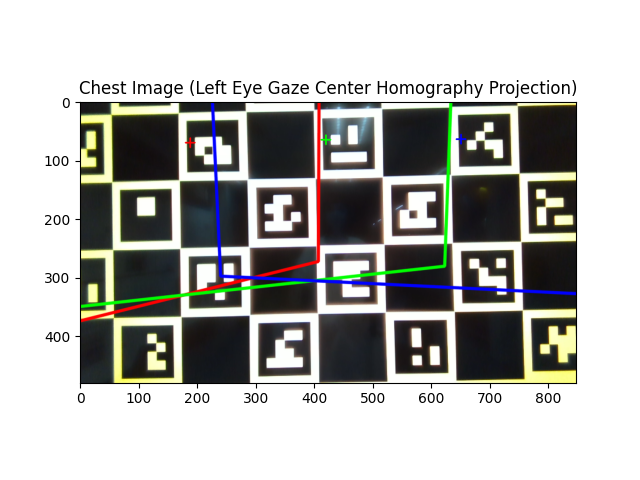

In [221]:
# Projection of Img1 border to Img2

img2_disp = cv2.polylines(copy.deepcopy(img2),[np.int32(dst1)],True,(255,0,0),3, cv2.LINE_AA)
img2_disp = cv2.polylines(img2_disp,[np.int32(dst2)],True,(0,255,0),3, cv2.LINE_AA)
img2_disp = cv2.polylines(img2_disp,[np.int32(dst3)],True,(0,0,255),3, cv2.LINE_AA)
img2_disp = cv2.drawMarker(img2_disp, (round(left_u_list[0]), round(left_v_list[0])), color=(255,0,0), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
img2_disp = cv2.drawMarker(img2_disp, (round(left_u_list[7]), round(left_v_list[7])), color=(0, 255, 0), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
img2_disp = cv2.drawMarker(img2_disp, (round(left_u_list[14]), round(left_v_list[14])), color=(0,0,255), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)

plt.figure()
plt.title('Chest Image (Left Eye Gaze Center Homography Projection)')
plt.imshow(img2_disp)

## Right Image 1

In [222]:
right_img = copy.deepcopy(img_right_list[0])
img1 = copy.deepcopy(right_img)
img2 = copy.deepcopy(chest_img)

In [223]:
# Processing
img1 = cv2.undistort(img1, right_eye_camera_mtx, right_eye_dist_coef)
img1_gray = cv2.cvtColor(copy.deepcopy(img1), cv2.COLOR_BGR2GRAY) 
img2_gray = cv2.cvtColor(copy.deepcopy(img2), cv2.COLOR_BGR2GRAY)

M1 = get_homography(img1, img2, right_eye_camera_mtx, right_eye_dist_coef)[0]
h,w = img1_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst1 = cv2.perspectiveTransform(pts,M1) 

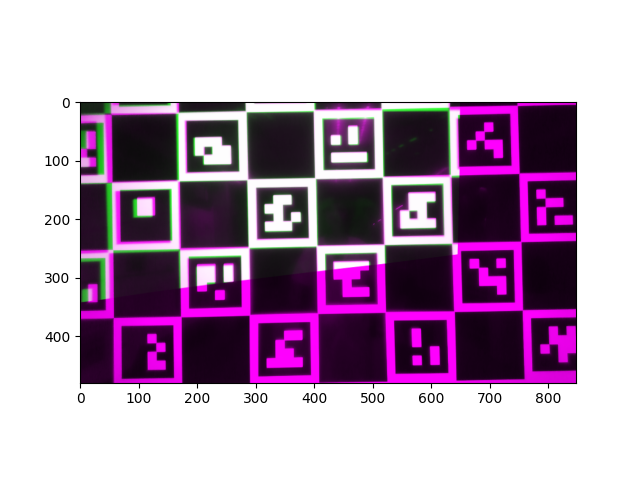

In [224]:
# Anaglyph 
img1_gray_warp = cv2.warpPerspective(img1_gray, M1, (img2_gray.shape[1], img2_gray.shape[0]))
disp_image = create_anaglyph_gray(img1_gray_warp, img2_gray)
plt.figure()
plt.imshow(disp_image)

## Right Image 2

In [225]:
right_img = copy.deepcopy(img_right_list[7])
img1 = copy.deepcopy(right_img)
img2 = copy.deepcopy(chest_img)

In [226]:
# Processing
img1 = cv2.undistort(img1, right_eye_camera_mtx, right_eye_dist_coef)
img1_gray = cv2.cvtColor(copy.deepcopy(img1), cv2.COLOR_BGR2GRAY) 
img2_gray = cv2.cvtColor(copy.deepcopy(img2), cv2.COLOR_BGR2GRAY)

M2 = get_homography(img1, img2, right_eye_camera_mtx, right_eye_dist_coef)[0]
h,w = img1_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst2 = cv2.perspectiveTransform(pts,M2) 

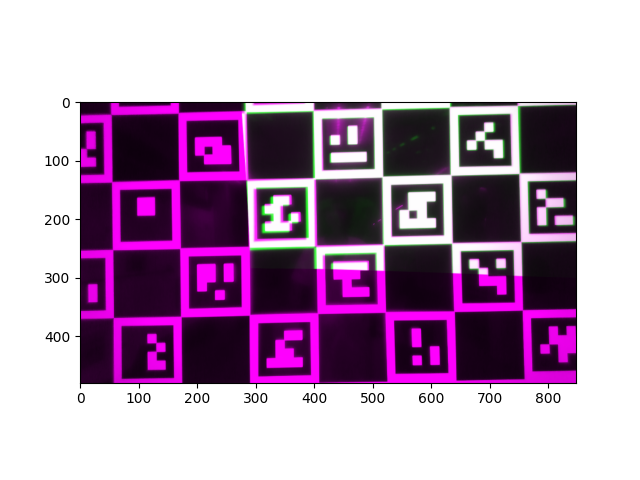

In [227]:
# Anaglyph 
img1_gray_warp = cv2.warpPerspective(img1_gray, M2, (img2_gray.shape[1], img2_gray.shape[0]))
disp_image = create_anaglyph_gray(img1_gray_warp, img2_gray)
plt.figure()
plt.imshow(disp_image)

## Right Image 3

In [228]:
right_img = copy.deepcopy(img_right_list[14])
img1 = copy.deepcopy(right_img)
img2 = copy.deepcopy(chest_img)

In [229]:
# Processing
img1 = cv2.undistort(img1, right_eye_camera_mtx, right_eye_dist_coef)
img1_gray = cv2.cvtColor(copy.deepcopy(img1), cv2.COLOR_BGR2GRAY) 
img2_gray = cv2.cvtColor(copy.deepcopy(img2), cv2.COLOR_BGR2GRAY)

M3 = get_homography(img1, img2, right_eye_camera_mtx, right_eye_dist_coef)[0]
h,w = img1_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst3 = cv2.perspectiveTransform(pts,M3) 

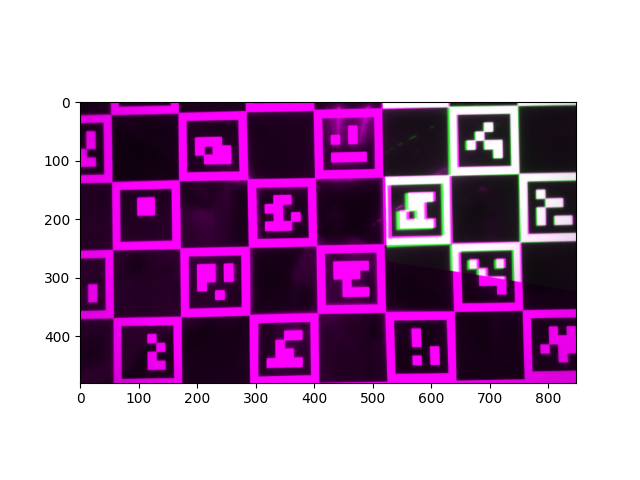

In [230]:
# Anaglyph 
img1_gray_warp = cv2.warpPerspective(img1_gray, M3, (img2_gray.shape[1], img2_gray.shape[0]))
disp_image = create_anaglyph_gray(img1_gray_warp, img2_gray)
plt.figure()
plt.imshow(disp_image)

## Right Chest Image

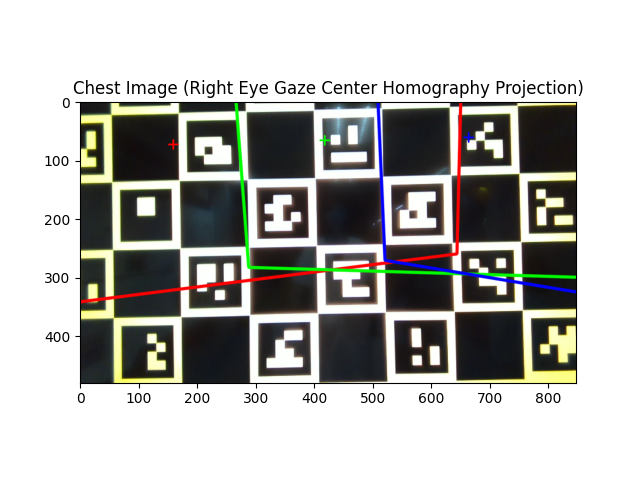

In [231]:
# Projection of Img1 border to Img2

img2_disp = cv2.polylines(copy.deepcopy(img2),[np.int32(dst1)],True,(255,0,0),3, cv2.LINE_AA)
img2_disp = cv2.polylines(img2_disp,[np.int32(dst2)],True,(0,255,0),3, cv2.LINE_AA)
img2_disp = cv2.polylines(img2_disp,[np.int32(dst3)],True,(0,0,255),3, cv2.LINE_AA)
img2_disp = cv2.drawMarker(img2_disp, (round(right_u_list[0]), round(right_v_list[0])), color=(255,0,0), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
img2_disp = cv2.drawMarker(img2_disp, (round(right_u_list[7]), round(right_v_list[7])), color=(0, 255, 0), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)
img2_disp = cv2.drawMarker(img2_disp, (round(right_u_list[14]), round(right_v_list[14])), color=(0,0,255), 
                          markerType=cv2.MARKER_CROSS, markerSize=16, thickness=2)

plt.figure()
plt.title('Chest Image (Right Eye Gaze Center Homography Projection)')
plt.imshow(img2_disp)

# All Homography Projections

# --------------------------------------------------------

# Left Eye Gaze Center Calculation 

In [ ]:
# Calculation of the original angles

yaw_left = math.degrees(math.atan((gx_left-cx_left)/fx_left))
pitch_left = math.degrees(math.atan((cy_left-gy_left)/fy_left))

print('yaw_left (deg):', yaw_left)
print('pitch_left (deg):', pitch_left)

In [ ]:
# Calculation of the undistorted angles

yaw_left = math.degrees(math.atan((gx_left_prime-cx_left)/fx_left))
pitch_left = math.degrees(math.atan((cy_left-gy_left_prime)/fy_left))

print('yaw_left (deg):', yaw_left)
print('pitch_left (deg):', pitch_left)

In [ ]:
# Transformation: Gaze Center Left to Left'

r1 = Rotation.from_euler("zyx", [0, yaw_left, pitch_left], degrees=True)
T_gaze_ctr_left = np.eye(4)
T_gaze_ctr_left[:3,:3] = r1.as_matrix()

print('Gaze Center Left Eye:',T_gaze_ctr_left)
print('Gaze Center to Euler:',r1.as_euler('zyx', degrees=True))

# Left Eye Transformation to Chest RGB Camera

In [ ]:
# T_cl

T_chest_rgb_left_list = []
for T_left in filt_df['T_bl']:
    T_chest_rgb_left_list.append(chest_rgb_to_eye(T_chest,T_left))
    
filt_df['T_cl'] = T_chest_rgb_left_list

# Final Left Eye Transformation

In [ ]:
# T_ol' = T_oc x T_bc^(-1) x T_bl x T_ll'

T_ol_list = []
T_olprime_list = []
for T_left in filt_df['T_bl']:
    T_ol = T_chest_cam_ctr @ np.linalg.inv(T_chest) @ T_left 
    T_ol_list.append(T_ol)
    T_olprime = T_ol @ T_gaze_ctr_left
    T_olprime_list.append(T_olprime)

filt_df['T_ol'] = T_ol_list
filt_df['T_olprime'] = T_olprime_list

# Left Eye Home Position

In [ ]:
# Left Eye Zero Position

left_df = filt_df[(filt_df['theta_tilt_cmd_tminus1']==0) 
                  & (filt_df['theta_left_pan_cmd_tminus1']==0)].reset_index()
T_ol_zero = mean_T(left_df['T_ol'])
T_olprime_zero = mean_T(left_df['T_olprime'])
print('T_olprime_zero:',T_olprime_zero )

In [ ]:
left_df['T_ol'].tolist()

# Right Eye Gaze Center Calculation

In [ ]:
# Right Eye

gx_right = calib_params['right_eye']['x_center']
gy_right = calib_params['right_eye']['y_center']

# Undistort Points
gx_right_prime, gy_right_prime = cv2.undistortPoints((gx_right,gy_right), 
                                                   right_eye_camera_mtx, 
                                                   right_eye_dist_coef, 
                                                   P=right_eye_camera_mtx).squeeze()

fx_right = right_eye_camera_mtx[0][0]
cx_right = right_eye_camera_mtx[0][2]
fy_right = right_eye_camera_mtx[1][1]
cy_right = right_eye_camera_mtx[1][2]

print('gx_right:', gx_right)
print('gx_right_prime:', gx_right_prime)
print('gx_right:', gx_right)
print('gy_right:',gy_right)
print('gy_right_prime:', gy_right_prime)
print('cy_right',cy_right)

In [ ]:
# Calculation of the original angles

yaw_right = math.degrees(math.atan((gx_right-cx_right)/fx_right))
pitch_right = math.degrees(math.atan((cy_right-gy_right)/fy_right))

print('yaw_right (deg):', yaw_right)
print('pitch_right (deg):', pitch_right)

In [ ]:
# Calculation of the undistorted angles

yaw_right = math.degrees(math.atan((gx_right_prime-cx_right)/fx_right))
pitch_right = math.degrees(math.atan((cy_right-gy_right_prime)/fy_right))

print('yaw_right (deg):', yaw_right)
print('pitch_right (deg):', pitch_right)

In [ ]:
# Gaze Center Right

r2 = Rotation.from_euler("zyx", [0, yaw_right, pitch_right], degrees=True)
T_gaze_ctr_right = np.eye(4)
T_gaze_ctr_right[:3,:3] = r2.as_matrix()
print('Gaze Center Right Eye:',T_gaze_ctr_right)
print(r2.as_euler('zyx', degrees=True))

# Right Eye Transformation to Chest RGB Camera

In [ ]:
# Final Right Eye List

T_chest_rgb_right_list = []
for T_right in filt_df['T_br']:
    T_chest_rgb_right_list.append(chest_rgb_to_eye(T_chest,T_right))
    
filt_df['T_cr'] = T_chest_rgb_right_list

# Final Right Eye Transformation

In [ ]:
# T_or' = T_oc x T_bc^(-1) x T_br x T_rr'

T_or_list = []
T_orprime_list = []
for T_right in filt_df['T_br']:
    T_or = T_chest_cam_ctr @ np.linalg.inv(T_chest) @ T_right 
    T_or_list.append(T_or)
    T_orprime = T_or @ T_gaze_ctr_right
    T_orprime_list.append(T_orprime)

filt_df['T_or'] = T_or_list
filt_df['T_orprime'] = T_orprime_list

# Right Eye Home Position

In [ ]:
# Right Eye Zero Position

right_df = filt_df[(filt_df['theta_tilt_cmd_tminus1']==0) 
                  & (filt_df['theta_right_pan_cmd_tminus1']==0)].reset_index()
T_or_zero = mean_T(right_df['T_or'])
T_orprime_zero = mean_T(right_df['T_orprime'])
print('T_orprime_zero:',T_orprime_zero )

# Plotting

In [ ]:
%matplotlib widget

Add the depth discrepancy (-0.0042m or the Z value offset to realsense glass) here for the get_chess_obj_pts

In [ ]:
# Get Depth Object Points

depth_obj_pts = get_chess_obj_pts(chest_img, depth_img, chest_cam_camera_mtx, chest_cam_dist_coef)

In [ ]:
# Transformed Left Eye Camera

# Plot 3D Axes

plt.figure()
ax = make_3d_axis(1, 111, unit="m")

# Plot Origin
ax = pr.plot_basis(ax, s=0.2)

# Plot 3D Chess Points
# for x,y,z in depth_obj_pts:
#    ax.scatter(x, y, z, color=colors[0], marker='.')

# Plot Chest Cam
ax = pr.plot_basis(ax, T_chest_cam_ctr[:3,:3], T_chest_cam_ctr[:3,-1], s=0.2)

# Plot Left Poses
for T in filt_df['T_olprime']:
    ax = pr.plot_basis(ax, T[:3,:3], T[:3,-1], s=1.0)

ax.view_init(elev=-90, azim=-90)
ax.set_title("camera transformation")

ax.set_zlim([-0.2, 2.0])

In [ ]:
# Transformed Right Eye Camera

# Plot 3D Axes

plt.figure()
ax = make_3d_axis(1, 111, unit="m")

# Plot Origin
ax = pr.plot_basis(ax, s=0.2)

# Plot 3D Chess Points
# for x,y,z in depth_obj_pts:
#    ax.scatter(x, y, z, color=colors[0], marker='.')

# Plot Chest Cam
ax = pr.plot_basis(ax, T_chest_cam_ctr[:3,:3], T_chest_cam_ctr[:3,-1], s=0.2)

# Plot Left Poses
for T in filt_df['T_orprime']:
    ax = pr.plot_basis(ax, T[:3,:3], T[:3,-1], s=1.0)

ax.view_init(elev=-90, azim=-90)
ax.set_title("camera transformation")

ax.set_zlim([-0.2, 2.0])

In [ ]:
# Transformed Total Plot

# Plot 3D Axes

plt.figure()
ax = make_3d_axis(1, 111, unit="m")

# Plot Origin
ax = pr.plot_basis(ax, s=0.2)

# Plot 3D Chess Points
# for x,y,z in depth_obj_pts:
#     ax.scatter(x, y, z, color=colors[0], marker='.')

# Plot Chest Cam
ax = pr.plot_basis(ax, T_chest_cam_ctr[:3,:3], T_chest_cam_ctr[:3,-1], s=0.2)

# Plot Left 0 Pose
ax = pr.plot_basis(ax, T_olprime_zero[:3,:3], T_olprime_zero[:3,-1], s=0.2, strict_check=False)

# Plot Right 0 Pose
ax = pr.plot_basis(ax, T_orprime_zero[:3,:3], T_orprime_zero[:3,-1], s=0.2, strict_check=False)

ax.view_init(elev=-90, azim=-90)
ax.set_title("camera transformation")

ax.set_zlim([-0.2, 2.0])

# Left Relative Transformation

In [ ]:
# T_l'0>l' = T_ol'_0^(-1) x T_ol'

T_lprime0lprime_list = []
for T_left in filt_df['T_olprime']:
    T_lprime0lprime = np.linalg.inv(T_olprime_zero) @ T_left
    T_lprime0lprime_list.append(T_lprime0lprime)
    
filt_df['T_lprime0lprime'] = T_lprime0lprime_list

In [ ]:
# Plotting

plt.figure()
ax = make_3d_axis(1, 111, unit="m")

# Plot Origin
ax = pr.plot_basis(ax, s=0.2)

# Plot Left Poses
for T in filt_df['T_lprime0lprime']:
    ax = pr.plot_basis(ax, T[:3,:3], T[:3,-1], s=1.0, strict_check=False)

ax.view_init(elev=-90, azim=-90)
ax.set_title("camera transformation")

ax.set_zlim([-0.2, 2.0])

# Right Relative Transformation

In [ ]:
# T_r'0>r' = T_or'_0^(-1) x T_or'

T_rprime0rprime_list = []
for T_right in filt_df['T_orprime']:
    T_rprime0rprime = np.linalg.inv(T_orprime_zero) @ T_right
    T_rprime0rprime_list.append(T_rprime0rprime)
    
filt_df['T_rprime0rprime'] = T_rprime0rprime_list

In [ ]:
# Plotting

plt.figure()
ax = make_3d_axis(1, 111, unit="m")

# Plot Origin
ax = pr.plot_basis(ax, s=0.2)

# Plot Left Poses
for T in filt_df['T_rprime0rprime']:
    ax = pr.plot_basis(ax, T[:3,:3], T[:3,-1], s=1.0, strict_check=False)

ax.view_init(elev=-90, azim=-90)
ax.set_title("camera transformation")

ax.set_zlim([-0.2, 2.0])

# Rotation Plot

## Left Eye Pan

In [ ]:
# Rotation

pitch_list = []
yaw_list = []
roll_list = []
for i in range(len(filt_df)):
    rmat = filt_df['T_lprime0lprime'][i][:3,:3]
    angles, mtxR, mtxQ, Qx, Qy, Qz = cv2.RQDecomp3x3(rmat)
    pitch_list.append(angles[0])
    yaw_list.append(angles[1])
    roll_list.append(angles[2])
filt_df['left_pitch'] = pitch_list
filt_df['left_yaw'] = yaw_list
filt_df['left_roll'] = roll_list

In [ ]:
np.sort(filt_df['theta_tilt_cmd_tminus1'].unique()).tolist()

In [ ]:
# Pan Slope Plot

plt.figure()

tilt_cmd_list = np.sort(filt_df['theta_tilt_cmd_tminus1'].unique()).tolist()
for i in range(len(tilt_cmd_list)):
    plt.scatter(-100,-100, color=colors[i])

for i in range(len(tilt_cmd_list)):
    df = filt_df[filt_df['theta_tilt_cmd_tminus1']==tilt_cmd_list[i]].reset_index()
    plt.scatter(df['theta_left_pan_cmd_tminus1'], df['left_yaw'], alpha=0.3, marker='.', color=colors[i])

# plt.legend(['roll', 'pitch', 'yaw'])  # Rotation across z, y, x [but currently in opencv coordinates]
plt.xlabel('Pan Motor Cmd (deg)')
plt.ylabel('Eye Yaw Rotation (deg)')
plt.xlim([-18, 18])
plt.ylim([-24, 24])
plt.grid()
plt.title('Left Eye')
plt.legend(['%i deg'%tilt for tilt in tilt_cmd_list], title='Tilt Position')

## Right Eye Pan

In [ ]:
# Rotation

pitch_list = []
yaw_list = []
roll_list = []
for i in range(len(filt_df)):
    rmat = filt_df['T_rprime0rprime'][i][:3,:3]
    angles, mtxR, mtxQ, Qx, Qy, Qz = cv2.RQDecomp3x3(rmat)
    pitch_list.append(angles[0])
    yaw_list.append(angles[1])
    roll_list.append(angles[2])
filt_df['right_pitch'] = pitch_list
filt_df['right_yaw'] = yaw_list
filt_df['right_roll'] = roll_list

In [ ]:
# Pan Slope

plt.figure()

tilt_cmd_list = np.sort(filt_df['theta_tilt_cmd_tminus1'].unique()).tolist()
for i in range(len(tilt_cmd_list)):
    plt.scatter(-100,-100, color=colors[i])

for i in range(len(tilt_cmd_list)):
    df = filt_df[filt_df['theta_tilt_cmd_tminus1']==tilt_cmd_list[i]].reset_index()
    plt.scatter(df['theta_right_pan_cmd_tminus1'], df['right_yaw'], alpha=0.3, marker='.', color=colors[i])

# plt.legend(['roll', 'pitch', 'yaw'])  # Rotation across z, y, x [but currently in opencv coordinates]
plt.xlabel('Pan Motor Cmd (deg)')
plt.ylabel('Eye Yaw Rotation (deg)')
plt.xlim([-18, 18])
plt.ylim([-24, 24])
plt.grid()
plt.title('Right Eye')
plt.legend(['%i deg'%tilt for tilt in tilt_cmd_list], title='Tilt Position')

## Left Eye Tilt

In [ ]:
# Tilt Slope Left

plt.figure()

left_pan_cmd_list = np.sort(filt_df['theta_left_pan_cmd_tminus1'].unique()).tolist()
for i in range(len(left_pan_cmd_list)):
    plt.scatter(-100,-100, color=colors[i])

for i in range(len(left_pan_cmd_list)):
    df = filt_df[filt_df['theta_left_pan_cmd_tminus1']==left_pan_cmd_list[i]].reset_index()
    plt.scatter(df['theta_tilt_cmd_tminus1'], df['left_pitch'], alpha=0.3, marker='.', color=colors[i])
    
# plt.legend(['roll', 'pitch', 'yaw'])  # Rotation across z, y, x [but currently in opencv coordinates]
plt.xlabel('Tilt Motor Cmd (deg)')
plt.ylabel('Eye Pitch Rotation (deg)')
plt.xlim([-30, 20])
plt.ylim([-12, 12])
plt.title('Left Eye')
plt.legend(['%i deg'%pan for pan in left_pan_cmd_list], title='Pan Position', ncol=3)
plt.grid()

## Right Eye Tilt

In [ ]:
# Tilt Slope Right

plt.figure()

right_pan_cmd_list = np.sort(filt_df['theta_right_pan_cmd_tminus1'].unique()).tolist()
for i in range(len(right_pan_cmd_list)):
    plt.scatter(-100,-100, color=colors[i])

for i in range(len(right_pan_cmd_list)):
    df = filt_df[filt_df['theta_right_pan_cmd_tminus1']==right_pan_cmd_list[i]].reset_index()
    plt.scatter(df['theta_tilt_cmd_tminus1'], df['right_pitch'], alpha=0.3, marker='.', color=colors[i])
    
# plt.legend(['roll', 'pitch', 'yaw'])  # Rotation across z, y, x [but currently in opencv coordinates]
plt.xlabel('Tilt Motor Cmd (deg)')
plt.ylabel('Eye Pitch Rotation (deg)')
plt.xlim([-30, 20])
plt.ylim([-12, 12])
plt.title('Right Eye')
plt.legend(['%i deg'%pan for pan in right_pan_cmd_list], title='Pan Position', ncol=3)
plt.grid()

# Translation Plot

## Left Eye

In [ ]:
# Translation Plot

fig, axs = plt.subplots(3, 1, figsize=(7,6))

tilt_cmd_list = np.sort(filt_df['theta_tilt_cmd_tminus1'].unique()).tolist()
for i in range(len(tilt_cmd_list)):
    axs[0].scatter(-100,-100, color=colors[i])

for i in range(len(tilt_cmd_list)):
    df = filt_df[filt_df['theta_tilt_cmd_tminus1']==tilt_cmd_list[i]].reset_index()
    for j in range(len(df)):        
        # Translate x
        axs[0].scatter(df['theta_left_pan_cmd_tminus1'][j], 100*df['T_lprime0lprime'][j][0,-1], alpha=0.3, marker='.', color=colors[i])
        # Translate y
        axs[1].scatter(df['theta_left_pan_cmd_tminus1'][j], 100*df['T_lprime0lprime'][j][1,-1], alpha=0.3, marker='.', color=colors[i])
        # Translate z
        axs[2].scatter(df['theta_left_pan_cmd_tminus1'][j], 100*df['T_lprime0lprime'][j][2,-1], alpha=0.3, marker='.', color=colors[i])

for i in range(3):
    axs[i].set_xlim([-18, 18])
    axs[i].set_ylim([-3.5, 3.5])
    axs[i].grid()

axs[0].set_ylabel('X (cm)')
axs[1].set_ylabel('Y (cm)')
axs[2].set_ylabel('Z (cm)')
plt.xlabel('Pan Motor Cmd (deg)')

# Create a common legend outside the plots
legend = axs[0].legend(['%i deg'%tilt for tilt in tilt_cmd_list], title='Tilt Position',
                       bbox_to_anchor=(1.025, 1.025), loc='upper left')

# Adjust the plot to make room for the legend
plt.subplots_adjust(right=0.80)
plt.subplots_adjust(hspace=0.2)
fig.suptitle('Left Eye')

## Right Eye

In [ ]:
# Translation Plot

fig, axs = plt.subplots(3, 1, figsize=(7,6))

tilt_cmd_list = np.sort(filt_df['theta_tilt_cmd_tminus1'].unique()).tolist()
for i in range(len(tilt_cmd_list)):
    axs[0].scatter(-100,-100, color=colors[i])

for i in range(len(tilt_cmd_list)):
    df = filt_df[filt_df['theta_tilt_cmd_tminus1']==tilt_cmd_list[i]].reset_index()
    for j in range(len(df)):        
        # Translate x
        axs[0].scatter(df['theta_right_pan_cmd_tminus1'][j], 100*df['T_rprime0rprime'][j][0,-1], alpha=0.3, marker='.', color=colors[i])
        # Translate y
        axs[1].scatter(df['theta_right_pan_cmd_tminus1'][j], 100*df['T_rprime0rprime'][j][1,-1], alpha=0.3, marker='.', color=colors[i])
        # Translate z
        axs[2].scatter(df['theta_right_pan_cmd_tminus1'][j], 100*df['T_rprime0rprime'][j][2,-1], alpha=0.3, marker='.', color=colors[i])

for i in range(3):
    axs[i].set_xlim([-18, 18])
    axs[i].set_ylim([-3.5, 3.5])
    axs[i].grid()

axs[0].set_ylabel('X (cm)')
axs[1].set_ylabel('Y (cm)')
axs[2].set_ylabel('Z (cm)')
plt.xlabel('Pan Motor Cmd (deg)')

# Create a common legend outside the plots
legend = axs[0].legend(['%i deg'%tilt for tilt in tilt_cmd_list], title='Tilt Position',
                       bbox_to_anchor=(1.025, 1.025), loc='upper left')

# Adjust the plot to make room for the legend
plt.subplots_adjust(right=0.80)
plt.subplots_adjust(hspace=0.2)
fig.suptitle('Right Eye')

# Fitting of Affine Transform

In [ ]:
from scipy.optimize import curve_fit

In [ ]:
def cmd_affine_transform(rot_vals, a, b, c):
    x,y,z = rot_vals
    cmd = a*x + b*y + c*z
    return cmd

In [ ]:
# Example
cmd_affine_transform(np.array([1,2,3]),1,1,1)

## Left Eye

In [ ]:
print(filt_df['left_yaw'].values[:5])
print(filt_df['left_pitch'].values[:5])

In [ ]:
# Data for X
X = np.ones((len(filt_df),3))
X[:,0] = filt_df['left_yaw'].values.astype(np.float64)
X[:,1] = filt_df['left_pitch'].values.astype(np.float64)
X[:,0]

In [ ]:
print(filt_df['theta_left_pan_cmd_tminus1'].values.astype(np.float64)[:5])
print(filt_df['theta_tilt_cmd_tminus1'].values.astype(np.float64)[:5])

In [ ]:
# Data for Y
Y = filt_df['theta_left_pan_cmd_tminus1'].values.astype(np.float64)
Y

In [ ]:
X.shape

In [ ]:
Y.shape

In [ ]:
# Fitting of the First Parameter

left_eye_pan_affine_param, param_cov = curve_fit(cmd_affine_transform,(filt_df['left_yaw'].values.astype(np.float64),
                                                   filt_df['left_pitch'].values.astype(np.float64),
                                                   np.ones(len(filt_df))),
                             filt_df['theta_left_pan_cmd_tminus1'].values.astype(np.float64))

In [ ]:
left_eye_pan_affine_param

In [ ]:
param_cov

In [ ]:
# Fitting of the Second Parameter
left_eye_tilt_affine_param, param_cov = curve_fit(cmd_affine_transform,(filt_df['left_yaw'].values.astype(np.float64),
                                                   filt_df['left_pitch'].values.astype(np.float64),
                                                   np.ones(len(filt_df))),
                             filt_df['theta_tilt_cmd_tminus1'].values.astype(np.float64))

In [ ]:
left_eye_tilt_affine_param

In [ ]:
param_cov

## Right Eye

In [ ]:
print(filt_df['right_yaw'].values[:5])
print(filt_df['right_pitch'].values[:5])

In [ ]:
# Data for X
X = np.ones((len(filt_df),3))
X[:,0] = filt_df['right_yaw'].values.astype(np.float64)
X[:,1] = filt_df['right_pitch'].values.astype(np.float64)
X[:,0]

In [ ]:
print(filt_df['theta_right_pan_cmd_tminus1'].values.astype(np.float64)[:5])
print(filt_df['theta_tilt_cmd_tminus1'].values.astype(np.float64)[:5])

In [ ]:
# Data for Y
Y = filt_df['theta_right_pan_cmd_tminus1'].values.astype(np.float64)
Y

In [ ]:
X.shape

In [ ]:
Y.shape

In [ ]:
# Fitting of the First Parameter

right_eye_pan_affine_param, param_cov = curve_fit(cmd_affine_transform,(filt_df['right_yaw'].values.astype(np.float64),
                                                   filt_df['right_pitch'].values.astype(np.float64),
                                                   np.ones(len(filt_df))),
                             filt_df['theta_right_pan_cmd_tminus1'].values.astype(np.float64))

In [ ]:
right_eye_pan_affine_param

In [ ]:
param_cov

In [ ]:
# Fitting of the Second Parameter

right_eye_tilt_affine_param, param_cov = curve_fit(cmd_affine_transform,(filt_df['right_yaw'].values.astype(np.float64),
                                                   filt_df['right_pitch'].values.astype(np.float64),
                                                   np.ones(len(filt_df))),
                             filt_df['theta_tilt_cmd_tminus1'].values.astype(np.float64))

In [ ]:
right_eye_tilt_affine_param

In [ ]:
param_cov

# Mean Difference between Left and Right Eye Prime

In [ ]:
np.set_printoptions(suppress=True)  # Changing from scientific to float

In [ ]:
T_diff_list = []
df = filt_df[filt_df['theta_left_pan_cmd_tminus1']==0].reset_index()  # For all tilt angles
for i in range(len(df)):
    T_left = df['T_olprime'][i]
    T_right = df['T_orprime'][i]
    T_diff = np.linalg.inv(T_left) @ T_right
    T_diff_list.append(T_diff)

In [ ]:
np.std(T_diff_list, axis=0)

In [ ]:
np.mean(T_diff_list, axis=0)

In [ ]:
df[['theta_tilt_cmd_tminus1', 'theta_left_pan_cmd_tminus1', 'T_ol']]

# Saving Parameters

In [ ]:
calib_params

In [ ]:
# Storing in New Calibration Parameters

new_calib_params = copy.deepcopy(calib_params)
new_calib_params['affine']['left_eye_pan'] = left_eye_pan_affine_param.tolist()
new_calib_params['affine']['left_eye_tilt'] = left_eye_tilt_affine_param.tolist()
new_calib_params['affine']['right_eye_pan'] = right_eye_pan_affine_param.tolist()
new_calib_params['affine']['right_eye_tilt'] = right_eye_tilt_affine_param.tolist()
new_calib_params['transformations']['T_origin_chest'] = T_chest_cam_ctr.tolist()
new_calib_params['transformations']['T_chest_left_eye'] = T_ol_zero.tolist()
new_calib_params['transformations']['T_chest_right_eye'] = T_or_zero.tolist()
new_calib_params['transformations']['T_left_eye_gaze_ctr'] = T_gaze_ctr_left.tolist()
new_calib_params['transformations']['T_right_eye_gaze_ctr'] = T_gaze_ctr_right.tolist()
new_calib_params